# DETECCIÓN DE CÁNCER DE CUELLO UTERINO

CLASIFICADOR BINARIO - 1: cáncer, 0: no cáncer

In [17]:
import pandas as pd
from pandas import DataFrame
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
from sklearn.preprocessing import StandardScaler
import random

In [2]:
df_C = pd.read_csv('df_clinical.csv', sep=';')
df_C = df_C.drop('Unnamed: 0', axis=1)
df_C

,age_at_index,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_t,ajcc_pathologic_m,...,initial_disease_status,number_of_cycles,therapeutic_agents,treatment_anatomic_site,treatment_dose,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_outcome,treatment_type
0,63,1,2,0,1944,63,2,2,6,2,...,0,4,1,1,43,0,1,0,0,3
1,63,1,2,0,1947,63,2,2,6,2,...,0,3,1,2,1428,0,0,1,0,4
2,63,1,2,0,1947,63,2,2,6,2,...,0,4,1,2,45,0,0,1,0,4
3,63,1,2,0,1945,63,2,2,6,2,...,0,4,1,3,4500,0,0,1,0,5
4,63,1,2,0,1949,63,2,2,6,2,...,0,3,1,0,2500,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1929,60,1,2,0,1953,49,2,2,9,2,...,0,3,1,2,538,0,0,1,1,4
1930,60,1,2,0,1949,43,2,2,9,2,...,0,4,1,1,42,0,1,0,0,3
1931,60,1,2,0,1953,43,2,2,9,2,...,0,3,1,1,39,0,0,0,1,3
1932,41,0,2,0,1971,41,2,2,10,0,...,0,3,1,1,477,0,0,1,0,3


#### Creación de una nueva columna para la presencia o ausencia de cáncer

In [3]:
df_C['cancer'] = df_C['treatment_outcome'].apply(lambda x: 0 if x == 0 else 1)
df_C

,age_at_index,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_t,ajcc_pathologic_m,...,number_of_cycles,therapeutic_agents,treatment_anatomic_site,treatment_dose,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_outcome,treatment_type,cancer
0,63,1,2,0,1944,63,2,2,6,2,...,4,1,1,43,0,1,0,0,3,0
1,63,1,2,0,1947,63,2,2,6,2,...,3,1,2,1428,0,0,1,0,4,0
2,63,1,2,0,1947,63,2,2,6,2,...,4,1,2,45,0,0,1,0,4,0
3,63,1,2,0,1945,63,2,2,6,2,...,4,1,3,4500,0,0,1,0,5,0
4,63,1,2,0,1949,63,2,2,6,2,...,3,1,0,2500,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1929,60,1,2,0,1953,49,2,2,9,2,...,3,1,2,538,0,0,1,1,4,1
1930,60,1,2,0,1949,43,2,2,9,2,...,4,1,1,42,0,1,0,0,3,0
1931,60,1,2,0,1953,43,2,2,9,2,...,3,1,1,39,0,0,0,1,3,1
1932,41,0,2,0,1971,41,2,2,10,0,...,3,1,1,477,0,0,1,0,3,0


'Cancer' será la variable objetivo a predecir de manera binaria

## Análisis exploratorio de los datos (EDA)

#### Tamaño del dataset de trabajo

In [4]:
df_C.shape

(1934, 36)

#### Información de las variables

In [5]:
df_C.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1934 entries, 0 to 1933
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   age_at_index                 1934 non-null   int64
 1   ethnicity                    1934 non-null   int64
 2   race                         1934 non-null   int64
 3   vital_status                 1934 non-null   int64
 4   year_of_birth                1934 non-null   int64
 5   age_at_diagnosis             1934 non-null   int64
 6   ajcc_clinical_m              1934 non-null   int64
 7   ajcc_clinical_n              1934 non-null   int64
 8   ajcc_clinical_t              1934 non-null   int64
 9   ajcc_pathologic_m            1934 non-null   int64
 10  ajcc_pathologic_n            1934 non-null   int64
 11  ajcc_pathologic_t            1934 non-null   int64
 12  classification_of_tumor      1934 non-null   int64
 13  days_to_diagnosis            1934 non-null   int

#### Valores NaN por variable

In [6]:
df_C.isna().sum()

age_at_index                   0
ethnicity                      0
race                           0
vital_status                   0
year_of_birth                  0
age_at_diagnosis               0
ajcc_clinical_m                0
ajcc_clinical_n                0
ajcc_clinical_t                0
ajcc_pathologic_m              0
ajcc_pathologic_n              0
ajcc_pathologic_t              0
classification_of_tumor        0
days_to_diagnosis              0
days_to_last_follow_up         0
figo_stage                     0
icd_10_code                    0
morphology                     0
pregnant_at_diagnosis          0
primary_diagnosis              0
prior_malignancy               0
site_of_resection_or_biopsy    0
tumor_grade                    0
days_to_treatment_end          0
days_to_treatment_start        0
initial_disease_status         0
number_of_cycles               0
therapeutic_agents             0
treatment_anatomic_site        0
treatment_dose                 0
treatment_

#### Análisis estadístico de las variables

In [7]:
df_C.describe().T

,count,mean,std,min,25%,50%,75%,max
age_at_index,1934.0,48.682523,12.077973,19.0,40.0,48.0,57.0,88.0
ethnicity,1934.0,0.859359,0.347741,0.0,1.0,1.0,1.0,1.0
race,1934.0,2.526887,0.921127,0.0,2.0,2.0,4.0,4.0
vital_status,1934.0,0.388831,0.487611,0.0,0.0,0.0,1.0,1.0
year_of_birth,1934.0,1959.355222,11.801053,1917.0,1952.0,1962.0,1968.0,1987.0
age_at_diagnosis,1934.0,47.879524,10.911508,20.0,41.0,47.0,54.0,88.0
ajcc_clinical_m,1934.0,1.675801,0.733405,0.0,2.0,2.0,2.0,2.0
ajcc_clinical_n,1934.0,1.698035,0.686750,0.0,2.0,2.0,2.0,2.0
ajcc_clinical_t,1934.0,7.484488,2.648491,0.0,6.0,8.0,10.0,10.0
ajcc_pathologic_m,1934.0,1.750776,0.653643,0.0,2.0,2.0,2.0,2.0


#### Estudio de correlación

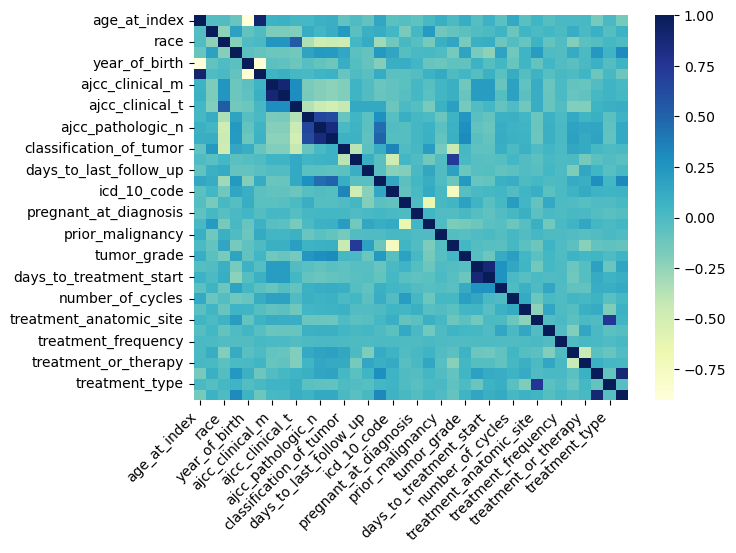

In [8]:
plt.figure(figsize=(7,5))
corr_matrix = df_C.corr(method='pearson')

heatmap = sns.heatmap(corr_matrix, annot=False, cmap="YlGnBu")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha="right")
plt.show()

#### Pares de variables con correlación alta

In [9]:
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)) # Parte superior de la matriz (sin duplicados)

high_corr = [(col, row) for col in upper_triangle.columns for row in upper_triangle.index if abs(upper_triangle[col][row]) > 0.8]

for col, row in high_corr:
    print(f"'{col}' and '{row}' correlation = {upper_triangle[col][row]:.2f}\n")

'year_of_birth' and 'age_at_index' correlation = -0.90

'age_at_diagnosis' and 'age_at_index' correlation = 0.92

'age_at_diagnosis' and 'year_of_birth' correlation = -0.87

'ajcc_clinical_n' and 'ajcc_clinical_m' correlation = 0.89

'ajcc_pathologic_t' and 'ajcc_pathologic_n' correlation = 0.85

'days_to_treatment_start' and 'days_to_treatment_end' correlation = 0.88

'cancer' and 'treatment_outcome' correlation = 0.88



#### Correlaciones con la variable objetivo 'cancer'

In [10]:
correlation_with_cancer = df_C.corr()['cancer']
correlation_with_cancer

age_at_index                  -0.155067
ethnicity                      0.074267
race                          -0.002934
vital_status                   0.320193
year_of_birth                  0.064995
age_at_diagnosis              -0.122727
ajcc_clinical_m                0.021980
ajcc_clinical_n                0.030902
ajcc_clinical_t                0.107225
ajcc_pathologic_m              0.068609
ajcc_pathologic_n              0.129881
ajcc_pathologic_t              0.130021
classification_of_tumor        0.014337
days_to_diagnosis             -0.046518
days_to_last_follow_up         0.019241
figo_stage                     0.327420
icd_10_code                    0.069066
morphology                     0.021528
pregnant_at_diagnosis         -0.020917
primary_diagnosis              0.033081
prior_malignancy              -0.004632
site_of_resection_or_biopsy   -0.092318
tumor_grade                    0.058122
days_to_treatment_end          0.155489
days_to_treatment_start        0.095179


In [15]:
high_corr_cancer = pd.DataFrame(list(correlation_with_cancer.items()), 
                                             columns=['variable', 'correlation_with_cancer'])

top_4 = high_corr_cancer.nlargest(4, 'correlation_with_cancer')
top_4

,variable,correlation_with_cancer
35,cancer,1.000000
33,treatment_outcome,0.881275
15,figo_stage,0.327420
3,vital_status,0.320193


**Conclusiones de la matriz de correlación de Pearson**

Los pares de variables que mayor correlación presentan son:
* 'age_at_diagnosis' - 'age_at_index': r = 0,92
* 'year_of_birth' - 'age_at_index': r = -0,90
* 'ajcc_clinical_n' - 'ajcc_clinical_m': r = 0,89
* 'days_to_treatment_start' - 'days_to_treatment_end' & 'cancer' - 'treatment_outcome': r = 0,88

Las variables predictoras con mayor correlación con la variable objetivo 'cancer' son 'treatment outcome' (r=0,88), 'figo stage' (r=0,33) y 'vital status' (r=0,32). Dado que para las dos últimas variables predictoras se trata de coeficientes de correlación valores menor a 0,5, la correlación existente entre dichas variables es débil, por lo que se puede concluir que las variables nombradas (figo state y vital status) pueden tener cierto impacto en la presencia o ausencia del cáncer, pero no son completamente determinantes.

La variable 'treatment outcome' tiene una correlación alta (mayor a 0,8) con la variable respuesta. Esto significa que dichas variables presentan una relación lineal positiva fuerte, de manera que el cambio en la variable independiente producirá un cambio proporcional en la variable objetivo.

Sin embargo, se ha decidido eliminar la variable 'treatment outcome' dado que la variable respuesta se ha obtenido en base a ella, por lo que resulta redundante y puede añadir dependencias, produciendo overfitting en los modelos.

In [12]:
df_C = df_C.drop('treatment_outcome', axis=1)
df_C

,age_at_index,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_t,ajcc_pathologic_m,...,initial_disease_status,number_of_cycles,therapeutic_agents,treatment_anatomic_site,treatment_dose,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_type,cancer
0,63,1,2,0,1944,63,2,2,6,2,...,0,4,1,1,43,0,1,0,3,0
1,63,1,2,0,1947,63,2,2,6,2,...,0,3,1,2,1428,0,0,1,4,0
2,63,1,2,0,1947,63,2,2,6,2,...,0,4,1,2,45,0,0,1,4,0
3,63,1,2,0,1945,63,2,2,6,2,...,0,4,1,3,4500,0,0,1,5,0
4,63,1,2,0,1949,63,2,2,6,2,...,0,3,1,0,2500,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1929,60,1,2,0,1953,49,2,2,9,2,...,0,3,1,2,538,0,0,1,4,1
1930,60,1,2,0,1949,43,2,2,9,2,...,0,4,1,1,42,0,1,0,3,0
1931,60,1,2,0,1953,43,2,2,9,2,...,0,3,1,1,39,0,0,0,3,1
1932,41,0,2,0,1971,41,2,2,10,0,...,0,3,1,1,477,0,0,1,3,0


#### Distribución de los valores que toma la variable dependiente

In [13]:
df_C['cancer'].value_counts()

cancer
0    1075
1     859
Name: count, dtype: int64

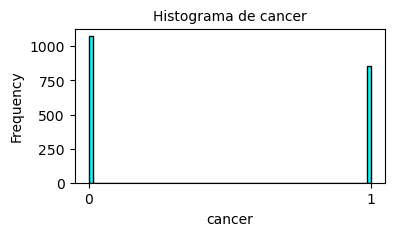

In [22]:
plt.figure(figsize=(4,2))
target = 'cancer'

df_C[target].plot.hist(bins = 70, color='cyan', edgecolor='black')
plt.title(f'Histograma de {target}', fontsize = 10)
plt.xlabel(f'{target}')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.show()

Aproximadamente el 55% de los registros almacenan el valor '0' y el 45% almacenan el valor '1' para la variable objetivo, lo que significa que el 55% de la población de estudio no tiene cáncer, mientras que el 45% restante sí.

Dado que ambas proporciones son relativamente cercanas al 50%, se considera que las categorías de la clasificación binaria están razonablemente balanceadas, almacenando 1.075 y 859 registros respectivamente.

#### Distribución de los valores que toma cada variable predictora

In [15]:
vars_pred = df_C.drop(['cancer'], axis=1)
colors = ['#%06X' % random.randint(0, 0xFFFFFF) for v in range(len(vars_pred))]

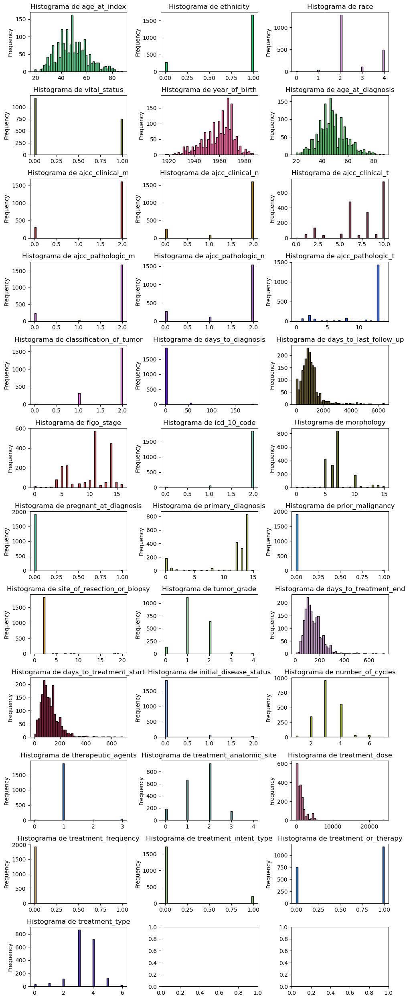

In [16]:
fig, axes = plt.subplots(nrows=12, ncols=3, figsize=(10,25))

for var, c, ax in zip(vars_pred, colors, axes.flatten()):

    df_C[var].plot.hist(bins = 50, color=c, edgecolor='black', ax=ax)
    ax.set_title(f'Histograma de {var}')
    ax.grid(False)

plt.tight_layout()
plt.show()

 **VARIABLES CONTINUAS**
- **age_at_index:** rango de 19 a 88, con predominancia entre los 40 y 57 años.
- **year_of_birth:** rango de 1917 a 1987, con predominancia entre los años 1952 y 1968.
- **age_at_diagnosis:** rango de 20 a 88, con predominancia entre los 41 y 54 años.
- **days_to_last_follow_up:** rango de 0 a 6.408, con predominancia entre los 576 y 1.228 días.
- **days_to_treatment_end:** rango de 10 a 722, con predominancia entre los 98 y 183 días.
- **days_to_treatment_start:** rango de 1 a 684, con predominancia entre los 72 y 149 días.
- **number_of_cycles:** rango de 1 a 7, con predominancia entre 3 y 4 ciclos.
- **treatment_dose:** rango de 0 a 24.000, con predominancia entre 50 y 1.569 centigrays (cGy).

**VARIABLES CATEGÓRICAS**
- **ethnicity:** 2 clases, predominancia de la clase 1 (not hispanic or latino).
- **race:** 5 clases, predominancia de la clase 2 (black or african american).
- **vital_status:** 2 clases, predominancia de la clase 0 (alive).
- **ajcc_clinical_m:** 3 clases, predominancia de la clase 2 (MX).
- **ajcc_clinical_n:** 3 clases, predominancia de la clase 2 (NX).
- **ajcc_clinical_t:** 11 clases, predominancia de la clase 10 (TX).
- **ajcc_pathologic_m:** 3 clases, predominancia de la clase 2 (MX).
- **ajcc_pathologic_n:** 3 clases, predominancia de la clase 2 (NX).
- **ajcc_pathologic_t:** 15 clases, predominancia de la clase 13 (TX).
- **classification_of_tumor:** 3 clases, predominancia de la clase 2 (primary).
- **figo_stage:** 17 clases, predominancia de la clase 11 (stage IIB).
- **icd_10_code:** 3 clases, predominancia de la clase 2 (C53.9).
- **morphology:** 16 clases, predominancia de la clase 7 (8072/3).
- **pregnant_at_diagnosis:** 2 clases, predominancia de la clase 0 (no).
- **primary_diagnosis:** 16 clases, predominancia de la clase 14 (squamous cell carcinoma, nonkeratinizing, NOS).
- **prior_malignancy:** 2 clases, predominancia de la clase 0 (no).
- **site_of_resection_or_biopsy:** 21 clases, predominancia de la clase 2 (cervix uteri).
- **tumor_grade:** 5 clases, predominancia de la clase 1 (G2).
- **initial_disease_status:** 3 clases, predominancia de la clase 0 (initial diagnosis).
- **therapeutic_agents:** 4 clases, predominancia de la clase 1 (cisplatin).
- **treatment_anatomic_site:** 5 clases, predominancia de la clase 2 (other).
- **treatment_frequency:** 2 clases, predominancia de la clase 0 (once weekly).
- **treatment_intent_type:** 2 clases, predominancia de la clase 0 (adjuvant).
- **treatment_or_therapy:** 2 clases, predominancia de la clase 1 (yes).
- **treatment_type:** 7 clases, predominancia de la clase 3 (pharmaceutical therapy, NOS).

#### Distribución de las variables predictoras respecto a la variable objetivo 'cancer'

In [17]:
continuous_columns = ['age_at_index', 'year_of_birth', 'age_at_diagnosis', 'days_to_diagnosis', 'days_to_last_follow_up',
                     'days_to_treatment_end', 'days_to_treatment_start', 'number_of_cycles', 'treatment_dose']

categorical_columns = ['ethnicity', 'race', 'vital_status','ajcc_clinical_m', 'ajcc_clinical_n',
                       'ajcc_clinical_t', 'ajcc_pathologic_m', 'ajcc_pathologic_n', 'ajcc_pathologic_t',
                       'classification_of_tumor', 'figo_stage', 'icd_10_code', 'morphology', 'pregnant_at_diagnosis',
                       'primary_diagnosis', 'prior_malignancy', 'site_of_resection_or_biopsy', 'tumor_grade',
                       'initial_disease_status', 'therapeutic_agents', 'treatment_anatomic_site', 'treatment_frequency',
                       'treatment_intent_type', 'treatment_or_therapy', 'treatment_type']

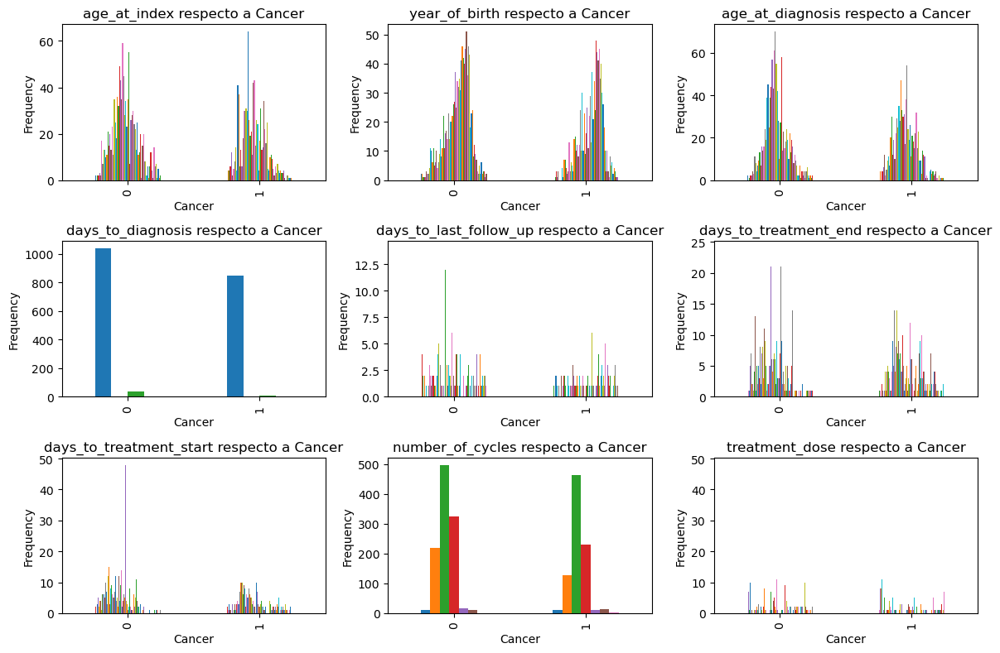

In [18]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for idx, column in enumerate(continuous_columns):

    row = idx // 3
    col = idx % 3

    grouped_df = df_C.groupby(['cancer'])[column].value_counts().unstack()

    ax = axes[row,col]
    grouped_df.plot(kind='bar', stacked=False, ax=ax)
    ax.set_xlabel('Cancer')
    ax.set_ylabel('Frequency')
    ax.legend().set_visible(False)
    ax.set_title(f'{column} respecto a Cancer')

plt.tight_layout()
plt.show()

Las variables continuas se distribuyen de manera aproximadamente equitativa entre las dos categorías que presenta la variable objetivo, con una ligera mayor distribución hacia la clase 0.

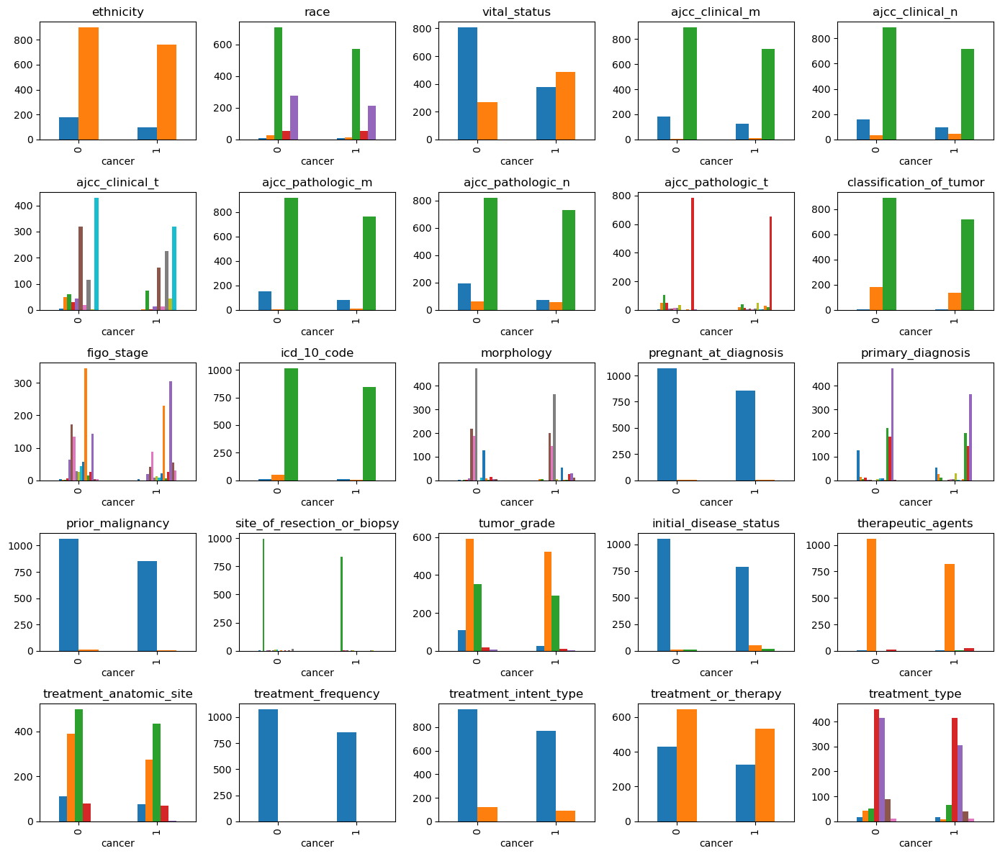

In [19]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(14,12))

for idx, column in enumerate(categorical_columns):

    row = idx // 5
    col = idx % 5

    grouped_df = df_C.groupby(['cancer'])[column].value_counts().unstack()

    ax = axes[row,col]
    grouped_df.plot(kind='bar', stacked=False, ax=ax)
    ax.set_xlabel('cancer')
    #ax.set_ylabel('Frequency')
    ax.legend().set_visible(False)
    ax.set_title(column)

plt.tight_layout()
plt.show()

Al igual que sucede con las variables continuas, las variables categóricas se distribuyen de manera aproximadamente equitativa entre las dos categorías que presenta la variable objetivo, con una ligera mayor distribución hacia la clase 0.

#### Normalización de los registros

In [20]:
scaler = StandardScaler()
scaler.fit(df_C)
df_C2 = pd.DataFrame(scaler.transform(df_C), columns=df_C.columns)
df_C2 # DATAFRAME ESCALADO

,age_at_index,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_t,ajcc_pathologic_m,...,initial_disease_status,number_of_cycles,therapeutic_agents,treatment_anatomic_site,treatment_dose,treatment_frequency,treatment_intent_type,treatment_or_therapy,treatment_type,cancer
0,1.185727,0.404547,-0.572151,-0.797628,-1.301510,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,1.033551,-0.124496,-0.700528,-0.787921,-0.022745,2.835028,-1.248279,-0.382470,-0.893907
1,1.185727,0.404547,-0.572151,-0.797628,-1.047230,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,-0.186771,-0.124496,0.588550,0.146329,-0.022745,-0.352730,0.801103,0.656431,-0.893907
2,1.185727,0.404547,-0.572151,-0.797628,-1.047230,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,1.033551,-0.124496,0.588550,-0.786572,-0.022745,-0.352730,0.801103,0.656431,-0.893907
3,1.185727,0.404547,-0.572151,-0.797628,-1.216750,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,1.033551,-0.124496,1.877629,2.218543,-0.022745,-0.352730,0.801103,1.695331,-0.893907
4,1.185727,0.404547,-0.572151,-0.797628,-0.877710,1.386095,0.44216,0.439815,-0.560648,0.381384,...,-0.211311,-0.186771,-0.124496,-1.989607,0.869445,-0.022745,-0.352730,0.801103,-2.460271,-0.893907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1929,0.937277,0.404547,-0.572151,-0.797628,-0.538669,0.102714,0.44216,0.439815,0.572365,0.381384,...,-0.211311,-0.186771,-0.124496,0.588550,-0.454019,-0.022745,-0.352730,0.801103,0.656431,1.118685
1930,0.937277,0.404547,-0.572151,-0.797628,-0.877710,-0.447306,0.44216,0.439815,0.572365,0.381384,...,-0.211311,1.033551,-0.124496,-0.700528,-0.788596,-0.022745,2.835028,-1.248279,-0.382470,-0.893907
1931,0.937277,0.404547,-0.572151,-0.797628,-0.538669,-0.447306,0.44216,0.439815,0.572365,0.381384,...,-0.211311,-0.186771,-0.124496,-0.700528,-0.790619,-0.022745,-0.352730,-1.248279,-0.382470,1.118685
1932,-0.636242,-2.471901,-0.572151,-0.797628,0.987013,-0.630646,0.44216,0.439815,0.950036,-2.679180,...,-0.211311,-0.186771,-0.124496,-0.700528,-0.495167,-0.022745,-0.352730,0.801103,-0.382470,-0.893907


In [21]:
df_C2['cancer'] = df_C2['cancer'].astype(int)

## MODELOS ML

In [22]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split

#### Función auxiliar para el cálculo de métricas de clasificación para los modelos ML

In [176]:
def calculate_metrics(y_test, y_pred, X_test, model):

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    pred_proba = model.predict_proba(X_test)[:, 1]

    roc_auc = roc_auc_score(y_test, pred_proba)
    FPR, TPR, thresholds = roc_curve(y_test, pred_proba)

    conf_matrix = confusion_matrix(y_test, y_pred)

    TN, FP, FN, TP = conf_matrix.ravel()
    specificity = TN / (TN + FP)

    return accuracy, precision, recall, f1, roc_auc, FPR, TPR, conf_matrix, specificity

#### Árboles de decisión

In [26]:
from sklearn.tree import DecisionTreeClassifier

#### Separación de los datos en conjuntos 'train' y 'test'

In [27]:
X_C_DT = df_C2.drop(['cancer'], axis=1)
y_C_DT = df_C2['cancer'].values

X_train_C_DT, X_test_C_DT, y_train_C_DT, y_test_C_DT = train_test_split(X_C_DT, y_C_DT, test_size=0.2, random_state=5)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
DT_classifier = DecisionTreeClassifier()

param_grid = {"max_depth": [5,7,9,10,20],
              "min_samples_split": [2,5,10],
              "min_samples_leaf": [2,5,10],
              "criterion": ["gini","entropy"]}

search_DT = GridSearchCV(DT_classifier, param_grid, cv=5)
search_DT.fit(X_train_C_DT, y_train_C_DT)

print(f'Mejor combinación de hiperparámetros: {search_DT.best_params_}')
"""

Mejor combinación de hiperparámetros: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [28]:
C_clsDT = DecisionTreeClassifier(criterion = 'gini', # criterion=search_DT.best_params_['criterion'],
                                  max_depth = 10, # max_depth=search_DT.best_params_['max_depth'],
                                  min_samples_leaf = 2, # min_samples_leaf=search_DT.best_params_['min_samples_leaf'],
                                  min_samples_split = 5, # min_samples_split=search_DT.best_params_['min_samples_split'],
                                  max_features = None)

C_clsDT.fit(X_train_C_DT, y_train_C_DT)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5)

#### Predicción con el conjunto 'test'

In [29]:
y_pred_C_DT = C_clsDT.predict(X_test_C_DT)

#### Métricas del modelo y matriz de confusión

In [30]:
accuracy_C_DT, precision_C_DT, recall_C_DT, f1_C_DT, roc_auc_C_DT, fpr_C_DT, tpr_C_DT, conf_matrix_C_DT, specificity_C_DT = calculate_metrics(y_test_C_DT, y_pred_C_DT, X_test_C_DT, C_clsDT)

print(f'Accuracy: {accuracy_C_DT}')
print(f'Precision: {precision_C_DT}')
print(f'Recall: {recall_C_DT}')
print(f'F1-Score: {f1_C_DT}')
print(f'Specificity: {specificity_C_DT}')
print(f'ROC-AUC: {roc_auc_C_DT}')

Accuracy: 0.7906976744186046
Precision: 0.7763975155279503
Recall: 0.7352941176470589
F1-Score: 0.7552870090634441
Specificity: 0.8341013824884793
ROC-AUC: 0.8129981024667932


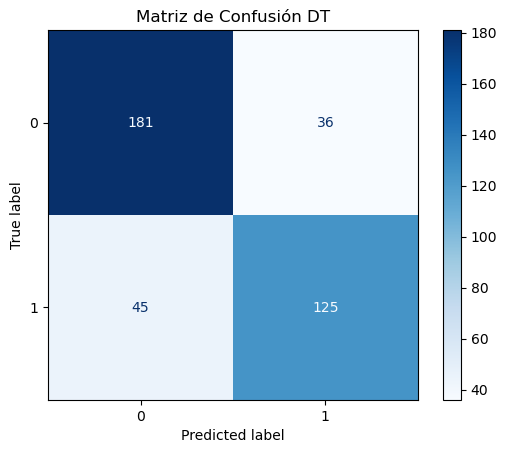

In [31]:
C_clsDT_display = ConfusionMatrixDisplay(conf_matrix_C_DT)
C_clsDT_display.plot(values_format='d', cmap='Blues')
C_clsDT_display.ax_.set(title='Matriz de Confusión DT');

De las 387 instancias del conjunto de test, el modelo DT ha clasificado 181 como verdaderos negativos (TN), 45 como falsos negativos (FN), 36 como falsos positivos (FP) y 125 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 306 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 79,07% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 77,64% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 73,53% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 75,53%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 83,41% de las instancias negativas reales.

Según la métrica 'ROC-AUC', el modelo presenta una gran capacidad de discriminación entre clases positivas y negativas, concretamente del 81,30%.

#### Random Forest

In [32]:
from sklearn.ensemble import RandomForestClassifier

#### Separación de los datos en conjuntos 'train' y 'test'

In [33]:
X_C_RF = df_C2.drop('cancer',axis=1) # df_C2 --> DATAFRAME ESCALADO
X_C_RF = np.array(X_C_RF)
y_C_RF = np.array(df_C2['cancer'])

X_train_C_RF ,X_test_C_RF ,y_train_C_RF ,y_test_C_RF = train_test_split(X_C_RF, y_C_RF, test_size=0.2, random_state=1)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
RF_classifier = RandomForestClassifier()

param_grid = {"n_estimators": [5,10,20,50],
              "max_depth": [5,7,10],
              "min_samples_split": [2,5,10],
              "min_samples_leaf": [2,5,10],
              "criterion": ["gini","entropy"]}

search_RF = GridSearchCV(RF_classifier, param_grid, cv=5)
search_RF.fit(X_train_C_RF, y_train_C_RF)

print(f'Mejor combinación de hiperparámetros: {search_RF.best_params_}')
"""

Mejor combinación de hiperparámetros: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [34]:
C_clsRF = RandomForestClassifier(criterion = 'entropy', # criterion=search_RF.best_params_['criterion'],
                                  n_estimators = 50, # n_estimators=search_RF.best_params_['n_estimators'],
                                  max_depth = 10, # max_depth=search_RF.best_params_['max_depth'],
                                  min_samples_leaf = 2, # min_samples_leaf=search_RF.best_params_['min_samples_leaf'],
                                  min_samples_split = 5, # min_samples_split=search_RF.best_params_['min_samples_split'],
                                  max_features = None)

C_clsRF.fit(X_train_C_RF, y_train_C_RF)

RandomForestClassifier(criterion='entropy', max_depth=10, max_features=None,
                       min_samples_leaf=2, min_samples_split=5,
                       n_estimators=50)

#### Predicción con el conjunto 'test'

In [35]:
y_pred_C_RF = C_clsRF.predict(X_test_C_RF)

#### Métricas del modelo y matriz de confusión

In [36]:
accuracy_C_RF, precision_C_RF, recall_C_RF, f1_C_RF, roc_auc_C_RF, fpr_C_RF, tpr_C_RF, conf_matrix_C_RF, specificity_C_RF = calculate_metrics(y_test_C_RF, y_pred_C_RF, X_test_C_RF, C_clsRF)

print(f'Accuracy: {accuracy_C_RF}')
print(f'Precision: {precision_C_RF}')
print(f'Recall: {recall_C_RF}')
print(f'F1-Score: {f1_C_RF}')
print(f'Specificity: {specificity_C_RF}')
print(f'ROC-AUC: {roc_auc_C_RF}\n')

Accuracy: 0.8552971576227391
Precision: 0.8703703703703703
Recall: 0.8011363636363636
F1-Score: 0.8343195266272189
Specificity: 0.9004739336492891
ROC-AUC: 0.9384694097371822



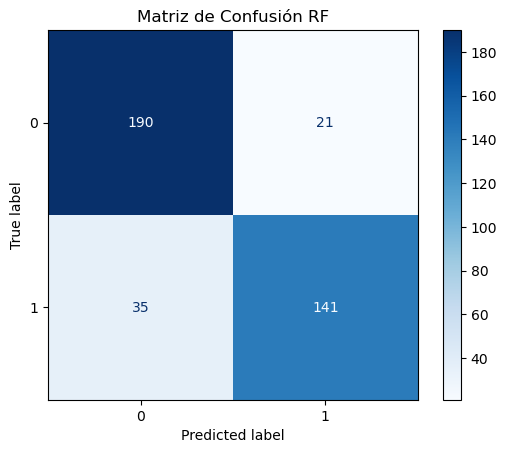

In [37]:
C_clsRF_display = ConfusionMatrixDisplay(conf_matrix_C_RF)
C_clsRF_display.plot(values_format='d', cmap='Blues')
C_clsRF_display.ax_.set(title='Matriz de Confusión RF');

De las 387 instancias del conjunto de test, el modelo RF ha clasificado 190 como verdaderos negativos (TN), 35 como falsos negativos (FN), 21 como falsos positivos (FP) y 141 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 331 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 85,53% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 87,04% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 80,11% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 83,43%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 90,05% de las instancias negativas reales.

Según la métrica 'ROC-AUC', el modelo presenta una gran capacidad de discriminación entre clases positivas y negativas, concretamente del 93,85%.

#### SVM

In [38]:
from sklearn import svm
from sklearn.svm import SVC

#### Separación de los datos en conjuntos 'train' y 'test'

In [39]:
X_C_SVM = df_C2.drop('cancer',axis=1) # df_C2 --> DATAFRAME ESCALADO
y_C_SVM = df_C2['cancer']

X_train_C_SVM, X_test_C_SVM, y_train_C_SVM, y_test_C_SVM = train_test_split(X_C_SVM, y_C_SVM, test_size=0.2, random_state=1)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
SVM_classifier = SVC()

param_grid = {"C": [0.1,1,5],
              "kernel": ["linear","poly","rbf"],
              "gamma": [0.001,0.01,0.1,1]}

search_SVM = GridSearchCV(SVM_classifier, param_grid, cv=5)
search_SVM.fit(X_train_C_SVM, y_train_C_SVM)

print(f'Mejor combinación de hiperparámetros: {search_SVM.best_params_}')
"""

Mejor combinación de hiperparámetros: {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [40]:
C_clsSVM = SVC(C = 1, # C=search_SVM.best_params_['C'],
                 kernel='rbf', # kernel=search_SVM.best_params_['kernel'],
                 gamma = 0.1, # gamma=search_SVM.best_params_['gamma'])
                 probability=True)

C_clsSVM.fit(X_train_C_SVM, y_train_C_SVM)

SVC(C=1, gamma=0.1, probability=True)

#### Predicción con el conjunto 'test'

In [41]:
y_pred_C_SVM = C_clsSVM.predict(X_test_C_SVM)

#### Métricas del modelo y matriz de confusión

In [42]:
accuracy_C_SVM, precision_C_SVM, recall_C_SVM, f1_C_SVM, roc_auc_C_SVM, fpr_C_SVM, tpr_C_SVM, conf_matrix_C_SVM, specificity_C_SVM = calculate_metrics(y_test_C_SVM, y_pred_C_SVM, X_test_C_SVM, C_clsSVM)

print(f'Accuracy: {accuracy_C_SVM}')
print(f'Precision: {precision_C_SVM}')
print(f'Recall: {recall_C_SVM}')
print(f'F1-Score: {f1_C_SVM}')
print(f'Specificity: {specificity_C_SVM}')
print(f'ROC-AUC: {roc_auc_C_SVM}\n')

Accuracy: 0.8397932816537468
Precision: 0.85625
Recall: 0.7784090909090909
F1-Score: 0.8154761904761905
Specificity: 0.8909952606635071
ROC-AUC: 0.9217470917707884



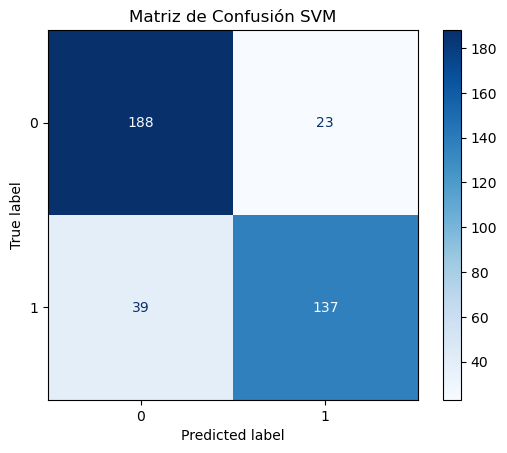

In [43]:
C_clsSVM_display = ConfusionMatrixDisplay(conf_matrix_C_SVM)
C_clsSVM_display.plot(values_format='d', cmap='Blues')
C_clsSVM_display.ax_.set(title='Matriz de Confusión SVM');

De las 387 instancias del conjunto de test, el modelo SVM ha clasificado 188 como verdaderos negativos (TN), 39 como falsos negativos (FN), 23 como falsos positivos (FP) y 137 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 325 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 83,98% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 85,62% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 77,84% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 81,55%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 89,10% de las instancias negativas reales.

Según la métrica 'ROC-AUC', el modelo presenta una gran capacidad de discriminación entre clases positivas y negativas, concretamente del 92,18%.

#### XGBoost

In [44]:
import xgboost as xgb

#### Separación de los datos en conjuntos 'train' y 'test'

In [45]:
X_C_XG = df_C2.drop('cancer',axis=1) # df_C2 --> DATAFRAME ESCALADO
X_C_XG = np.array(X_C_XG)
y_C_XG = np.array(df_C2['cancer'])

X_train_C_XG ,X_test_C_XG ,y_train_C_XG ,y_test_C_XG = train_test_split(X_C_XG, y_C_XG, test_size=0.2, random_state=1)

#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
XG_classifier = xgb.XGBClassifier(eval_metric='logloss')

param_grid = {"n_estimators": [5,10,20,50,100],
              "max_depth": [5,7,9,10],
              "learning_rate": [0.01,0.1,0.3]}

search_XG = GridSearchCV(XG_classifier, param_grid, cv=5)
search_XG.fit(X_train_C_XG, y_train_C_XG)

print(f'Mejor combinación de hiperparámetros: {search_XG.best_params_}')
"""

Mejor combinación de hiperparámetros: {'learning_rate': 0.3, 'max_depth': 10, 'n_estimators': 100}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [46]:
C_clsXG = xgb.XGBClassifier(n_estimators = 100, # n_estimators=search_XG.best_params_['n_estimators'],
                             max_depth = 10, # max_depth=search_XG.best_params_['max_depth'],
                             learning_rate = 0.3,  # learning_rate=search_XG.best_params_['learning_rate'])
                             eval_metric='logloss')

C_clsXG.fit(X_train_C_XG, y_train_C_XG)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.3, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

#### Predicción con el conjunto 'test'

In [47]:
y_pred_C_XG = C_clsXG.predict(X_test_C_XG)

#### Métricas del modelo y matriz de confusión

In [48]:
accuracy_C_XG, precision_C_XG, recall_C_XG, f1_C_XG, roc_auc_C_XG, fpr_C_XG, tpr_C_XG, conf_matrix_C_XG, specificity_C_XG = calculate_metrics(y_test_C_XG, y_pred_C_XG, X_test_C_XG, C_clsXG)

print(f'Accuracy: {accuracy_C_XG}')
print(f'Precision: {precision_C_XG}')
print(f'Recall: {recall_C_XG}')
print(f'F1-Score: {f1_C_XG}')
print(f'Specificity: {specificity_C_XG}')
print(f'ROC-AUC: {roc_auc_C_XG}\n')

Accuracy: 0.8501291989664083
Precision: 0.86875
Recall: 0.7897727272727273
F1-Score: 0.8273809523809523
Specificity: 0.9004739336492891
ROC-AUC: 0.9425894011202068



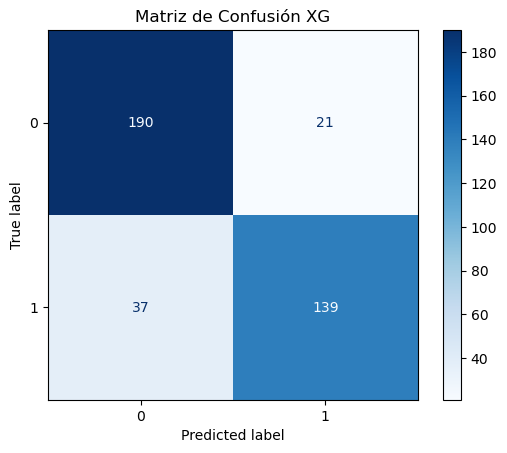

In [49]:
C_clsXG_display = ConfusionMatrixDisplay(conf_matrix_C_XG)
C_clsXG_display.plot(values_format='d', cmap='Blues')
C_clsXG_display.ax_.set(title='Matriz de Confusión XG');

De las 387 instancias del conjunto de test, el modelo XG ha clasificado 190 como verdaderos negativos (TN), 37 como falsos negativos (FN), 21 como falsos positivos (FP) y 139 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 329 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 85,01% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 86,88% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 78,98% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 82,74%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 90,05% de las instancias negativas reales.

Según la métrica 'ROC-AUC', el modelo presenta una gran capacidad de discriminación entre clases positivas y negativas, concretamente del 94,26%.

#### MLP

In [50]:
from sklearn.neural_network import MLPClassifier

#### Separación de los datos en conjuntos 'train' y 'test'

In [51]:
X_C_MLP = df_C2.drop('cancer',axis=1) # df_C2 --> DATAFRAME ESCALADO
X_C_MLP = np.array(X_C_MLP)
y_C_MLP = np.array(df_C2['cancer'])

X_train_val_C_MLP, X_test_C_MLP, y_train_val_C_MLP, y_test_C_MLP = train_test_split(X_C_MLP, y_C_MLP, test_size=0.2, random_state=1)

# test_size=0.1/(0.8) = 0.125 --> 10% como validation (12,5% del 80% = 10% del 100%)
X_train_C_MLP, X_val_C_MLP, y_train_C_MLP, y_val_C_MLP = train_test_split(X_train_val_C_MLP, y_train_val_C_MLP, test_size=0.125, random_state=1)

In [52]:
print(f"Conjunto 'train': {X_train_C_MLP.shape[0]} registros ({round(int(X_train_C_MLP.shape[0])/1934*100)}%)")
print(f"Conjunto 'validation': {X_val_C_MLP.shape[0]} registros ({round(int(X_val_C_MLP.shape[0])/1934*100)}%)")
print(f"Conjunto 'test': {X_test_C_MLP.shape[0]} registros ({round(int(X_test_C_MLP.shape[0])/1934*100)}%)")

Conjunto 'train': 1353 registros (70%)
Conjunto 'validation': 194 registros (10%)
Conjunto 'test': 387 registros (20%)


#### Búsqueda de la mejor combinación de hiperparámetros con GridSearch

In [ ]:
# SOLO EJECUTAR SI SE QUIERE HACER UN NUEVO GRIDSEARCH (CON HIPERPARÁMETROS DISTINTOS)
"""
MLP_classifier = MLPClassifier(early_stopping=True, validation_fraction=0.1, n_iter_no_change=10)

param_grid = {"hidden_layer_sizes": [(20,), (50,), (100,), (20,20), (20,50), (20,100), (50,20), (50,50), (50,100)],
              "activation": ["tanh","relu"],
              "solver": ["adam","sgd"],
              "alpha": [0.0001,0.001,0.01], # Regularización L2
              "learning_rate_init": [0.001,0.01,0.1],
              "max_iter": [500,1000,1250]}

search_MLP = GridSearchCV(MLP_classifier, param_grid, cv=3)
search_MLP.fit(X_train_C_MLP, y_train_C_MLP)

print(f'Mejor combinación de hiperparámetros: {search_MLP.best_params_}')
"""

Mejor combinación de hiperparámetros: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (50, 100), 'learning_rate_init': 0.1, 'max_iter': 1250, 'solver': 'sgd'}


#### Entrenamiento del modelo con el conjunto 'train' y la mejor combinación de hiperparámetros

In [53]:
C_clsMLP = MLPClassifier(hidden_layer_sizes = (50,100), # hidden_layer_sizes=search_MLP.best_params_['hidden_layer_sizes'],
                            activation = 'relu', # activation=search_MLP.best_params_['activation'],
                            solver = 'sgd', # solver=search_MLP.best_params_['solver'],
                            alpha = 0.01, # alpha=search_MLP.best_params_['alpha'],
                            learning_rate = "adaptive", # learning_rate=search_MLP.best_params_['learning_rate'],
                            learning_rate_init = 0.1, # learning_rate_init=search_MLP.best_params_['learning_rate_init'])
                            max_iter = 1250, # max_iter=search_MLP.best_params_['max_iter'],
                            batch_size='auto')

C_clsMLP.fit(X_train_C_MLP, y_train_C_MLP)

MLPClassifier(alpha=0.01, hidden_layer_sizes=(50, 100),
              learning_rate='adaptive', learning_rate_init=0.1, max_iter=1250,
              solver='sgd')

#### Predicción con el conjunto 'test'

In [54]:
y_pred_C_MLP = C_clsMLP.predict(X_test_C_MLP)

#### Métricas del modelo y matriz de confusión

In [55]:
accuracy_C_MLP, precision_C_MLP, recall_C_MLP, f1_C_MLP, roc_auc_C_MLP, fpr_C_MLP, tpr_C_MLP, conf_matrix_C_MLP, specificity_C_MLP = calculate_metrics(y_test_C_MLP, y_pred_C_MLP, X_test_C_MLP, C_clsMLP)

print(f'Accuracy: {accuracy_C_MLP}')
print(f'Precision: {precision_C_MLP}')
print(f'Recall: {recall_C_MLP}')
print(f'F1-Score: {f1_C_MLP}')
print(f'Specificity: {specificity_C_MLP}')
print(f'ROC-AUC: {roc_auc_C_MLP}\n')

Accuracy: 0.8656330749354005
Precision: 0.8604651162790697
Recall: 0.8409090909090909
F1-Score: 0.8505747126436781
Specificity: 0.8862559241706162
ROC-AUC: 0.9382270573028867



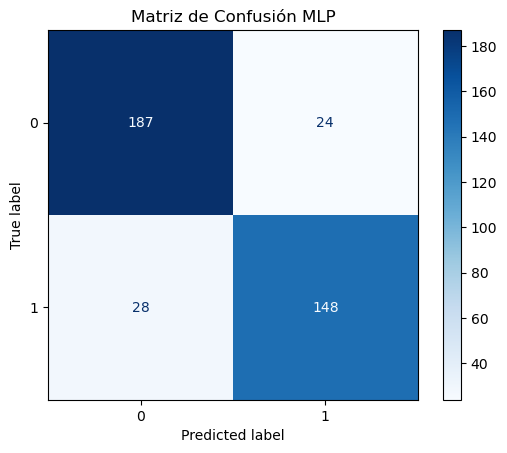

In [56]:
C_clsMLP_display = ConfusionMatrixDisplay(conf_matrix_C_MLP)
C_clsMLP_display.plot(values_format='d', cmap='Blues')
C_clsMLP_display.ax_.set(title='Matriz de Confusión MLP');

De las 387 instancias del conjunto de test, el modelo MLP ha clasificado 187 como verdaderos negativos (TN), 28 como falsos negativos (FN), 24 como falsos positivos (FP) y 148 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 335 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 86,56% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 86,05% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 84,09% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 85,06%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 88,63% de las instancias negativas reales.

Según la métrica 'ROC-AUC', el modelo presenta una gran capacidad de discriminación entre clases positivas y negativas, concretamente del 93,82%.

### COMPARATIVA DE MODELOS ML

#### Métricas

In [57]:
### 1. CLASIFICACIÓN CON ÁRBOLES DE DECISIÓN
print("\nÁRBOLES DE DECISIÓN")
print(f"Accuracy = {round(accuracy_C_DT*100,2)}%")
print(f"Precision = {round(precision_C_DT*100,2)}%")
print(f"Recall = {round(recall_C_DT*100,2)}%")
print(f"F1-Score = {round(f1_C_DT*100,2)}%")
print(f"Specificity = {round(specificity_C_DT*100,2)}%")

### 2. CLASIFICACIÓN CON RANDOM FORESTS
print("\nRANDOM FORESTS")
print(f"Accuracy = {round(accuracy_C_RF*100,2)}%")
print(f"Precision = {round(precision_C_RF*100,2)}%")
print(f"Recall = {round(recall_C_RF*100,2)}%")
print(f"F1-Score = {round(f1_C_RF*100,2)}%")
print(f"Specificity = {round(specificity_C_RF*100,2)}%")

### 3. CLASIFICACIÓN CON SVM
print("\nSVM")
print(f"Accuracy = {round(accuracy_C_SVM*100,2)}%")
print(f"Precision = {round(precision_C_SVM*100,2)}%")
print(f"Recall = {round(recall_C_SVM*100,2)}%")
print(f"F1-Score = {round(f1_C_SVM*100,2)}%")
print(f"Specificity = {round(specificity_C_SVM*100,2)}%")

### 4. CLASIFICACIÓN CON XGBOOST
print("\nXGBOOST")
print(f"Accuracy = {round(accuracy_C_XG*100,2)}%")
print(f"Precision = {round(precision_C_XG*100,2)}%")
print(f"Recall = {round(recall_C_XG*100,2)}%")
print(f"F1-Score = {round(f1_C_XG*100,2)}%")
print(f"Specificity = {round(specificity_C_XG*100,2)}%")

### 5. CLASIFICACIÓN CON MLP
print("\nMLP")
print(f"Accuracy = {round(accuracy_C_MLP*100,2)}%")
print(f"Precision = {round(precision_C_MLP*100,2)}%")
print(f"Recall = {round(recall_C_MLP*100,2)}%")
print(f"F1-Score = {round(f1_C_MLP*100,2)}%")
print(f"Specificity = {round(specificity_C_MLP*100,2)}%")


ÁRBOLES DE DECISIÓN
Accuracy = 79.07%
Precision = 77.64%
Recall = 73.53%
F1-Score = 75.53%
Specificity = 83.41%

RANDOM FORESTS
Accuracy = 85.53%
Precision = 87.04%
Recall = 80.11%
F1-Score = 83.43%
Specificity = 90.05%

SVM
Accuracy = 83.98%
Precision = 85.62%
Recall = 77.84%
F1-Score = 81.55%
Specificity = 89.1%

XGBOOST
Accuracy = 85.01%
Precision = 86.88%
Recall = 78.98%
F1-Score = 82.74%
Specificity = 90.05%

MLP
Accuracy = 86.56%
Precision = 86.05%
Recall = 84.09%
F1-Score = 85.06%
Specificity = 88.63%


#### Gráficas comparativas de las métricas

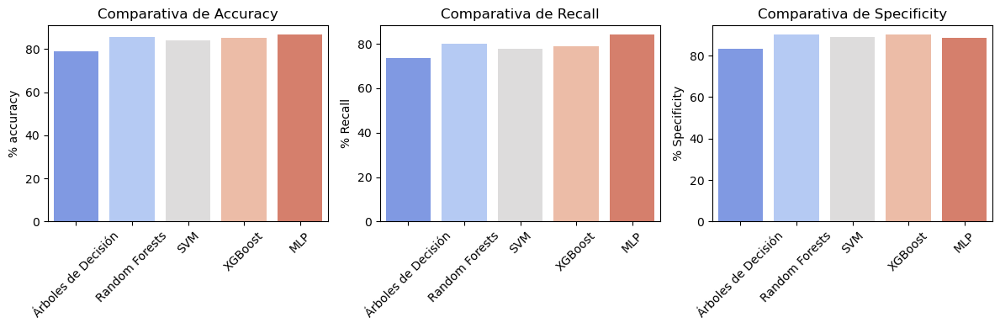

In [58]:
plt.figure(figsize=(12,4))
a
data = {"MODELOS": ["Árboles de Decisión", "Random Forests", "SVM", "XGBoost", "MLP"],

        "Accuracy": [round(accuracy_C_DT*100,2),round(accuracy_C_RF*100,2),round(accuracy_C_SVM*100,2),
                     round(accuracy_C_XG*100,2),round(accuracy_C_MLP*100,2)],

        "Recall": [round(recall_C_DT*100,2),round(recall_C_RF*100,2),round(recall_C_SVM*100,2),
                   round(recall_C_XG*100,2),round(recall_C_MLP*100,2)],

        "Specificity": [round(specificity_C_DT*100,2),round(specificity_C_RF*100,2),round(specificity_C_SVM*100,2),
                        round(specificity_C_XG*100,2),round(specificity_C_MLP*100,2)],
       }

results = pd.DataFrame(data)

plt.subplot(1,3,1)
sns.barplot(x="MODELOS", y="Accuracy", data=results, palette="coolwarm")
plt.title('Comparativa de Accuracy')
plt.xlabel('')
plt.ylabel('% accuracy')
plt.xticks(rotation=45)

plt.subplot(1,3,2)
sns.barplot(x="MODELOS", y="Recall", data=results, palette="coolwarm")
plt.title('Comparativa de Recall')
plt.xlabel('')
plt.ylabel('% Recall')
plt.xticks(rotation=45)

plt.subplot(1,3,3)
sns.barplot(x="MODELOS", y="Specificity", data=results, palette="coolwarm")
plt.title('Comparativa de Specificity')
plt.xlabel('')
plt.ylabel('% Specificity')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

Dado que se trata de un problema de clasificación en el ámbito clínico, se ha decidido estudiar las métricas 'accuracy', 'recall' y 'specificity' dado que proporcionan información sobre la capacidad de acierto del modelo, la capacidad para detectar correctamente la clase positiva (1: cáncer) y la capacidad para detectar correctamente la clase negativa (0: no cáncer), respectivamente. Las dos últimas métricas mencionadas son de gran importancia porque aseguran que la mayoría de casos patológicos se detecten y que los pacientes sin la patología no sean innecesariamente alarmados.

El modelo con mayor accuracy es MLP, logrando clasificar correctamente el 86,56% de las instancias totales. Después les siguen los modelos RF (85,53%), XGBoost (85,01%), SVM (83,98%) y DT (79,07%).

El modelo con mayor recall es MLP, logrando identificar correctamente el 84,09% de las instancias positivas reales. Después le siguen los modelos RF (80,11%), XGBoost (78,98%), SVM (77,84%) y DT (73,53%).

Los modelos con mayor specificity son RF y XGBoost, logrando identificar correctamente el 90,05% de las instancias negativas reales. Después le siguen los modelos SVM (89,1%), MLP (88,63%) y DT (83,41%).

En resumen:
- Clasificación descendente en función de 'accuracy': MLP, Random Forest, XGBoost, SVM y Árboles de Decisión.
- Clasificación descendente en función de 'recall': MLP, Random Forest, XGBoost, SVM y Árboles de Decisión.
- Clasificación descendente en función de 'specificity': Random Forest, XGBoost, SVM, MLP y Árboles de Decisión.

En conclusión, los modelos que proporcionan mejores resultados para la problemática estudiada son MLP, Random Forest y XGBoost, mientras que DT es el modelo con peores resultados.

#### Capacidad de generalización de los modelos

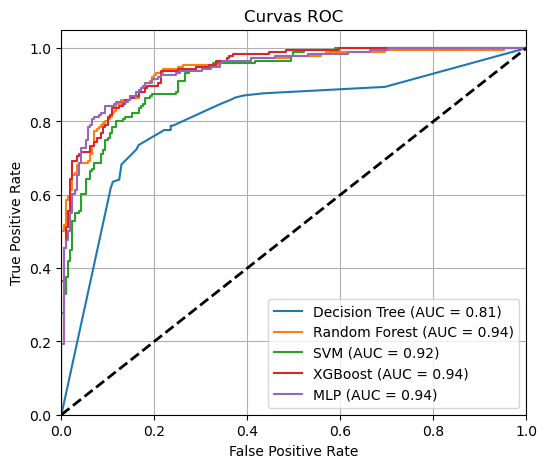

In [59]:
plt.figure(figsize=(6,5))

plt.plot(fpr_C_DT, tpr_C_DT, label=f'Decision Tree (AUC = {roc_auc_C_DT:.2f})')
plt.plot(fpr_C_RF, tpr_C_RF, label=f'Random Forest (AUC = {roc_auc_C_RF:.2f})')
plt.plot(fpr_C_SVM, tpr_C_SVM, label=f'SVM (AUC = {roc_auc_C_SVM:.2f})')
plt.plot(fpr_C_XG, tpr_C_XG, label=f'XGBoost (AUC = {roc_auc_C_XG:.2f})')
plt.plot(fpr_C_MLP, tpr_C_MLP, label=f'MLP (AUC = {roc_auc_C_MLP:.2f})')

plt.plot([0,1], [0,1], 'k--', lw=2) # Diagonal de referencia (clasificación aleatoria)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curvas ROC')
plt.legend(loc='lower right')
plt.grid()

plt.show()

Analizando la gráfica ROC-AUC de los modelos entrenados, se observa que los modelos RF, XGBoost y MLP son los que mayor capacidad de discriminación entre clases positivas y negativas presentan (0,94), seguido de SVM (0,92) y DT (0,81).

Por tanto, se concluye que los modelos con mayor rendimiento en términos de capacidad para discriminar entre la clase patológica y no patológica son Random Forest, XGBoost y MLP, mientras que el modelo de Árboles de Decisión es el menos efectivo.

# ALGORITMOS XAI

In [60]:
import aix360
import warnings
warnings.filterwarnings("ignore")

#### Función auxiliar para el cálculo de métricas de clasificación para los modelos XAI intrínsecos

In [265]:
def XAI_calculate_metrics(y_test, y_pred, model):

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    conf_matrix = confusion_matrix(y_test, y_pred)

    TN, FP, FN, TP = conf_matrix.ravel()
    specificity = TN / (TN + FP)

    return accuracy, precision, recall, f1, conf_matrix, specificity

### Explicaciones globales para entender el modelo basadas en la presencia de características mediante métodos post-hoc (explicativos extrínsecos)

### SHAP

In [61]:
import shap

In [64]:
def global_SHAP(id_model, model, data_train, data_test, labels):

    if id_model in ['DT','RF','XG']:
        explainer_SHAP = shap.TreeExplainer(model)
        shap_values = explainer_SHAP.shap_values(data_test)

    elif id_model in ['MLP']:
        explainer_SHAP = shap.KernelExplainer(model.predict_proba, shap.sample(data_train, 387))
        shap_values = explainer_SHAP.shap_values(shap.sample(data_test, 387))

    elif id_model in ['SVM']:
        explainer_SHAP = shap.KernelExplainer(model.predict_proba, shap.sample(data_train, 200))
        shap_values = explainer_SHAP.shap_values(shap.sample(data_test, 200))

    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None

    if isinstance(shap_values, np.ndarray):

        if len(shap_values.shape) == 3:
            inst, feat, clases = shap_values.shape  # (n_instancias, n_caracteristicas, n_clases)
            shap_values_class = shap_values[:,:,1] # 1: clase positiva (cáncer)

        elif len(shap_values.shape) == 2:
            inst, feat = shap_values.shape  # (n_instancias, n_caracteristicas)
            shap_values_class = shap_values

    elif isinstance(shap_values, list):
        shap_values_class = shap_values

    base_value = shap_values_class.mean()  # Promedio de los valores base

    if shap_values_class.shape[0] == data_test.shape[0]:
        data = data_test

    else:
        data = shap.sample(data_test, 200)

    explanation = shap.Explanation(values = shap_values_class, base_values = np.full(feat,base_value),
                                   data = data, feature_names = labels)

    shap.plots.bar(explanation)
    shap.summary_plot(explanation, cmap='Blues')

#### Explicación con SHAP del modelo de Árboles de Decisión

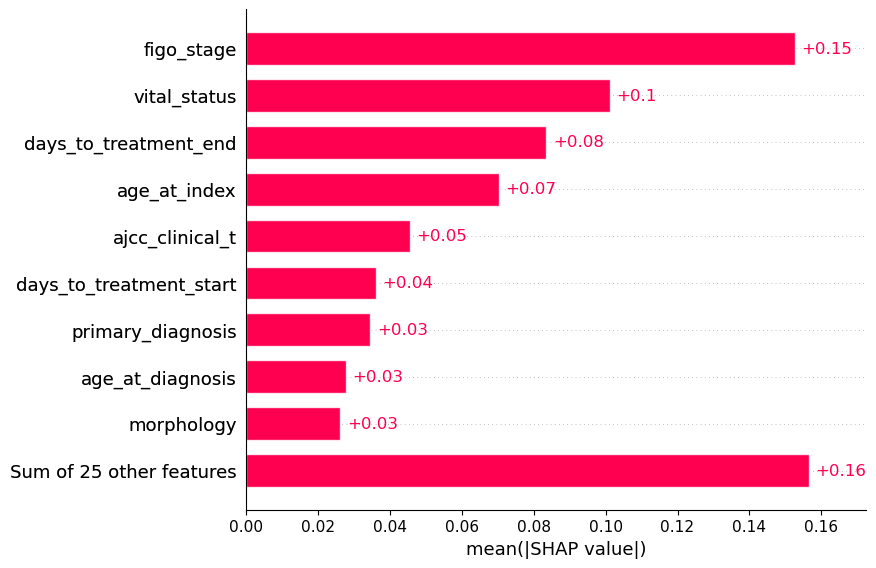

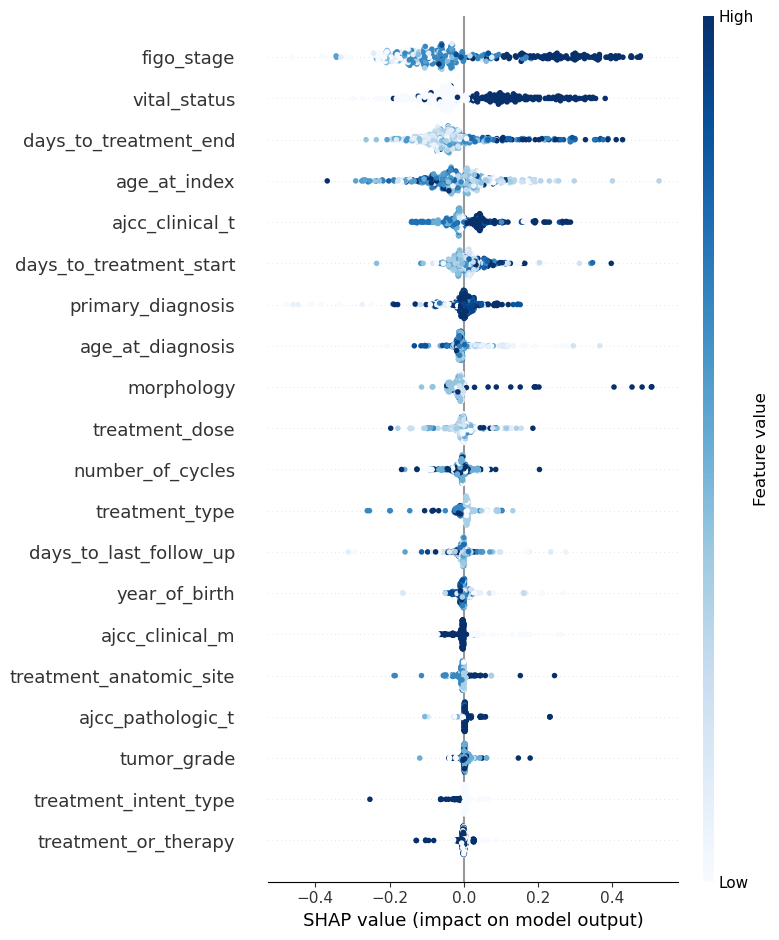

In [65]:
global_SHAP('DT', C_clsDT, X_train_C_DT, X_test_C_DT, X_C_DT.columns)

**Características con mayor importancia para el modelo DT con SHAP:** figo_stage, vital_status y days_to_treatment_end

Estas características aumentan la predicción del modelo en 0.15, 0.1 y 0.08 unidades respectivamente en comparación con el valor base.

Para estas variables, valores altos (representados en azul oscuro) impactan en el modelo aumentando la predicción, mientras que valores medios (representados en azul claro) y bajos (representados en blanco) tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.16 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

#### Explicación con SHAP del modelo Random Forest

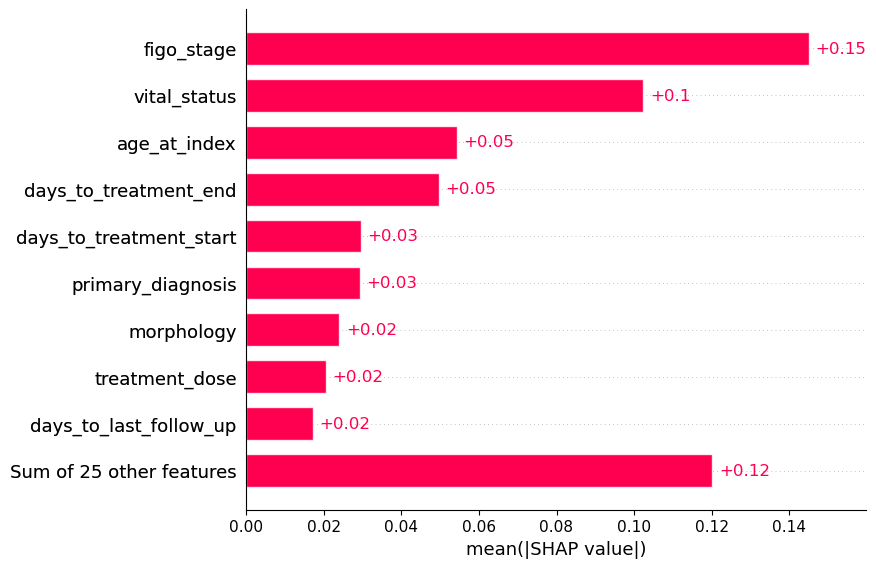

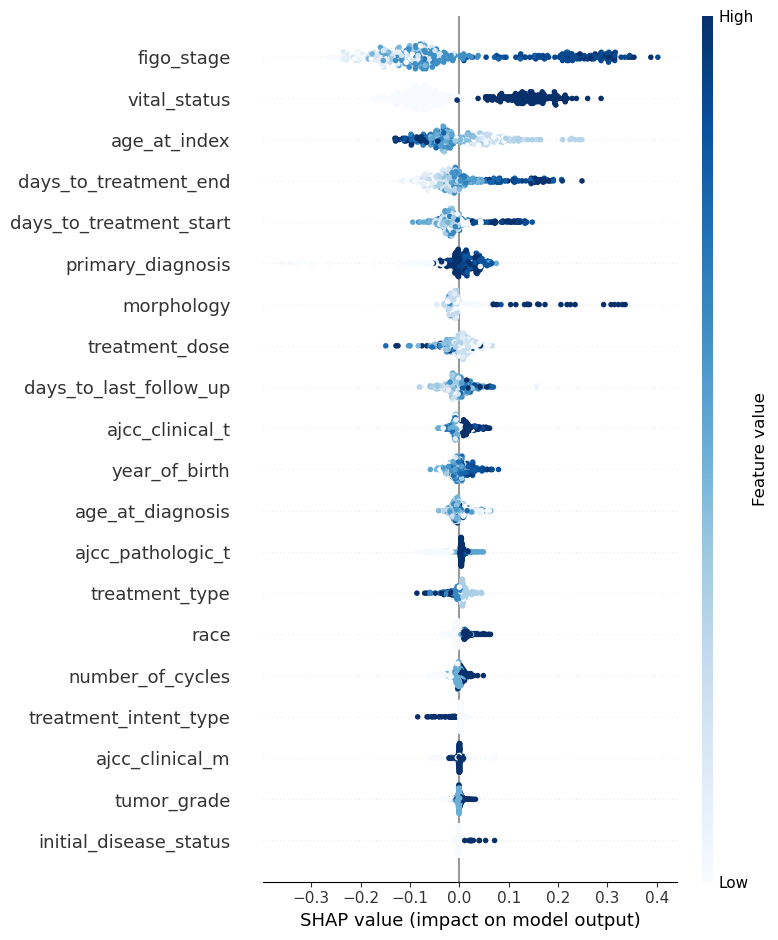

In [ ]:
X_test_C_RF_array = np.array(X_test_C_RF)

X_C_RF2 = df_C2.drop('cancer',axis=1)
labels_RF = X_C_RF2.columns

global_SHAP('RF', C_clsRF, X_train_C_RF, X_test_C_RF_array, labels_RF)

**Características con mayor importancia para el modelo RF con SHAP:** figo_stage, vital_status y age_at_index

Estas características aumentan la predicción del modelo en 0.15, 0.1 y 0.05 unidades respectivamente en comparación con el valor base.

Para las variables 'figo_stage' y 'vital_status', valores altos tienden a aumentar la predicción, mientras que valores medios y bajos tienden a disminuirla.

Por el contrario, para la variable 'age_at_index', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.12 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

#### Explicación con SHAP del modelo SVM

  0%|          | 0/200 [00:00<?, ?it/s]

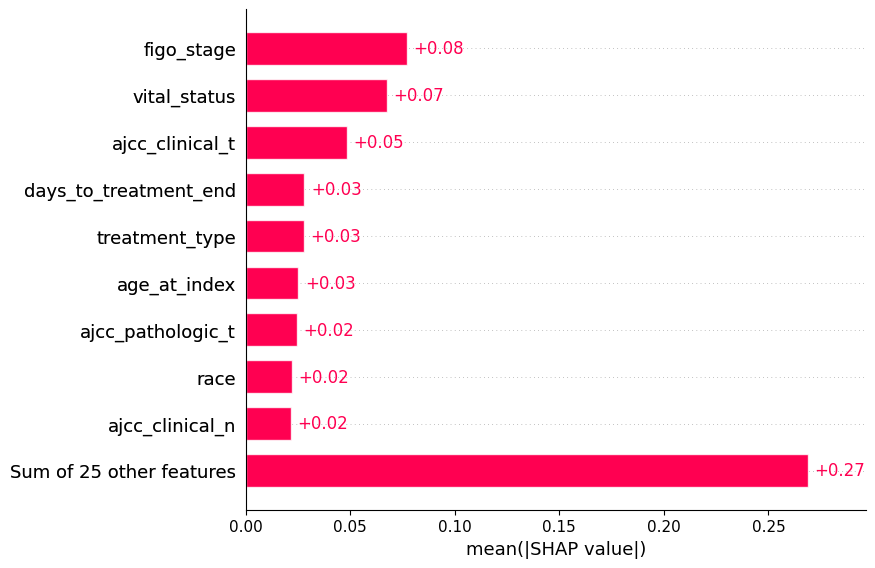

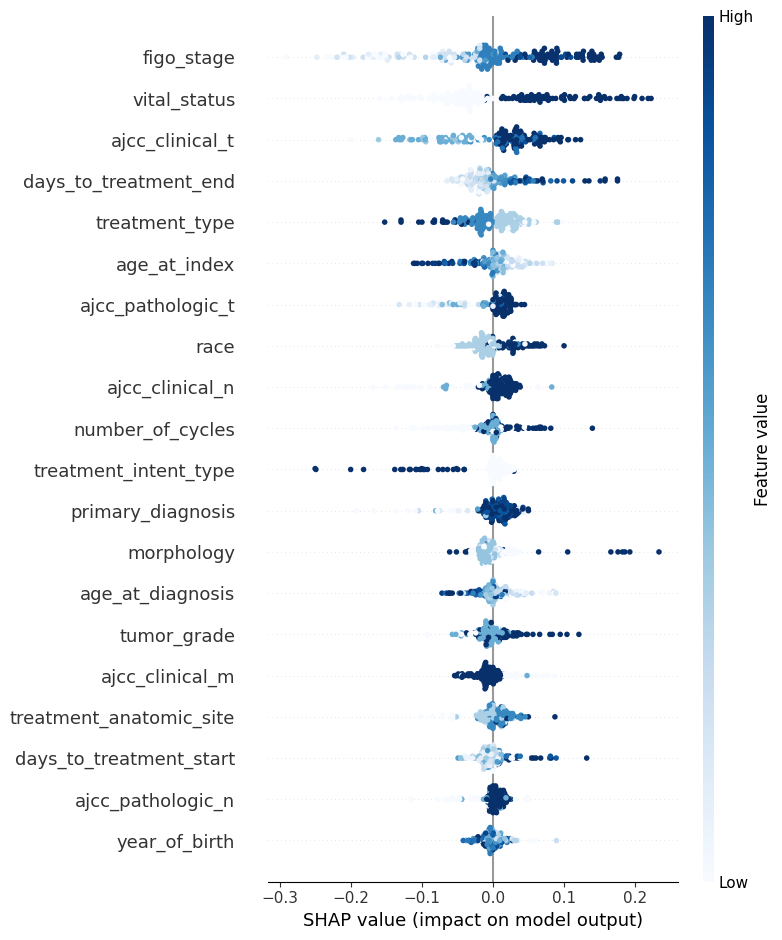

In [33]:
global_SHAP('SVM', C_clsSVM, X_train_C_SVM, X_test_C_SVM, X_C_SVM.columns)

**Características con mayor importancia para el modelo SVM con SHAP:** figo_stage, vital_status y ajcc_clinical_t

Estas características aumentan la predicción del modelo en 0.08, 0.06 y 0.05 unidades respectivamente en comparación con el valor base.

Para las variables 'figo_stage' y 'ajcc_clinical_t', valores altos tienden a aumentar la predicción, mientras que valores medios y bajos tienden a disminuirla.

Para la variable 'vital_status', valores altos y medios tienden a aumentar la predicción y valores bajos tienden a disminuirla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.27 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

#### Explicación con SHAP del modelo XGBoost

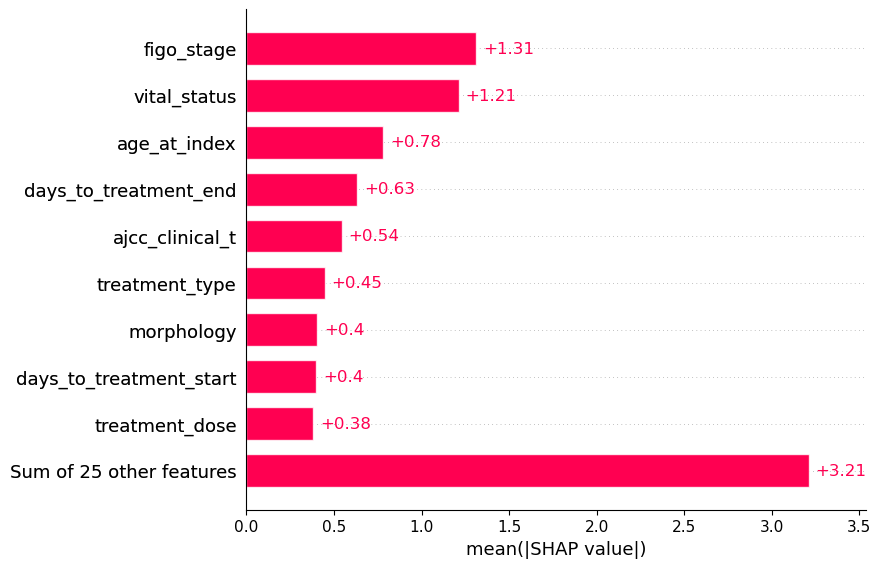

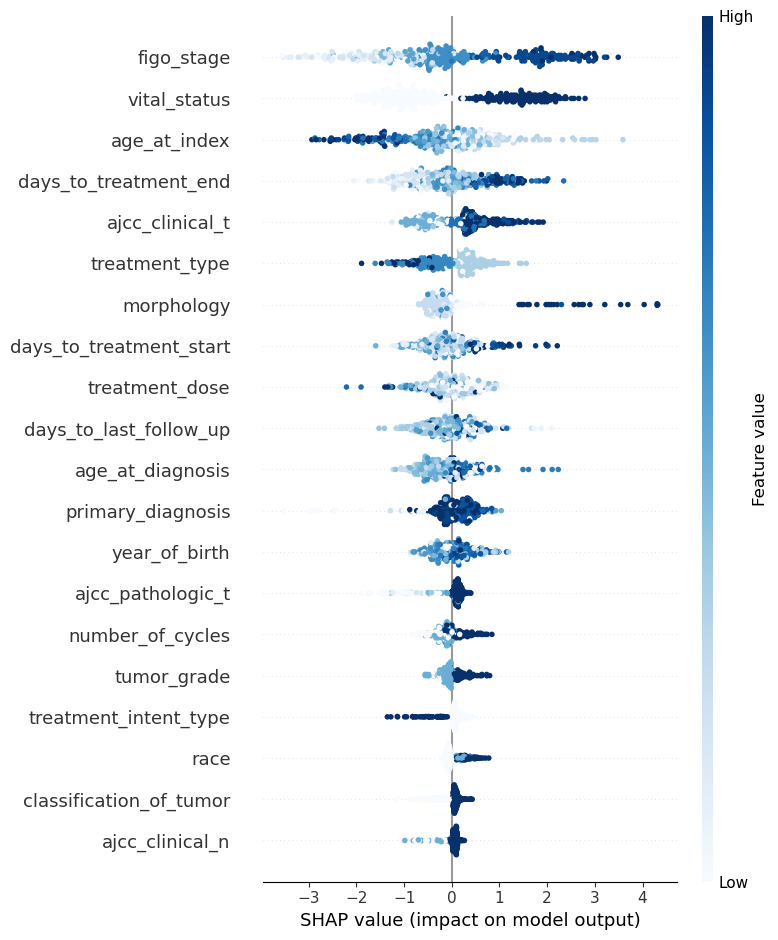

In [ ]:
X_test_C_XG_array = np.array(X_test_C_XG)

X_C_XG2 = df_C2.drop('cancer',axis=1)
labels_XG = X_C_XG2.columns

global_SHAP('XG', C_clsXG, X_train_C_XG, X_test_C_XG_array, labels_XG)

**Características con mayor importancia para el modelo XGBoost con SHAP:** figo_stage, vital_status y age_at_index

Estas características aumentan la predicción del modelo en 1.31, 1.21 y 0.78 unidades respectivamente en comparación con el valor base.

Para las variables 'figo_stage' y 'vital_status', valores altos y medios tienden a aumentar la predicción, mientras que valores bajos tienden a disminuirla.

Por el contrario, para la variable 'age_at_index', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 3.21 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

#### Explicación con SHAP del modelo MLP

Using 387 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/387 [00:00<?, ?it/s]

387
387


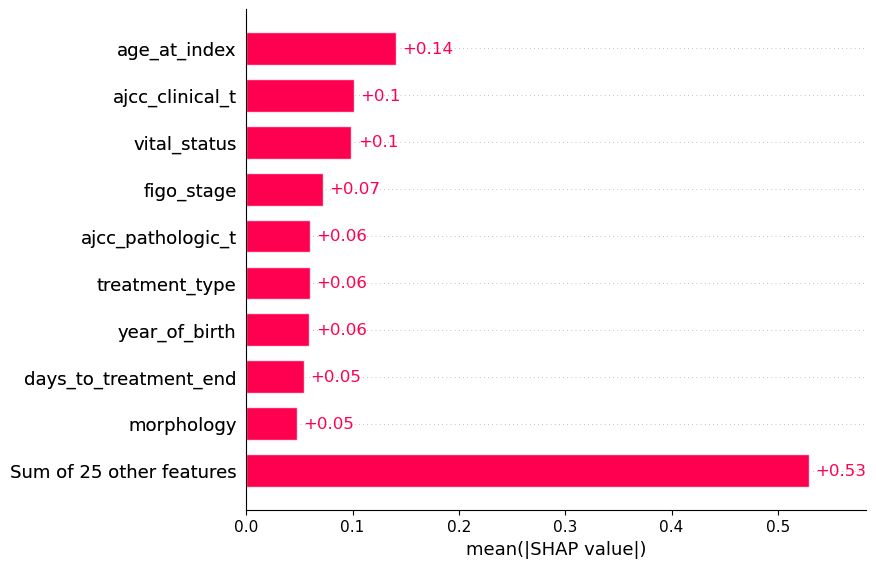

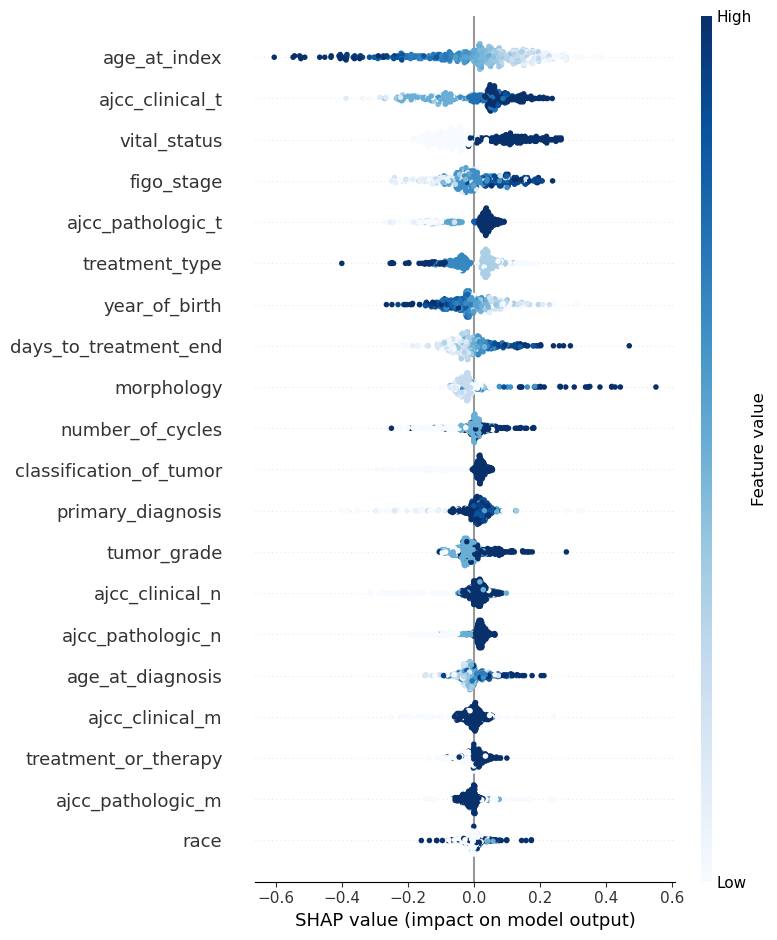

In [ ]:
X_test_C_MLP_array = np.array(X_test_C_MLP)

X_C_MLP2 = df_C2.drop('cancer',axis=1)
labels_MLP = X_C_MLP2.columns

global_SHAP('MLP', C_clsMLP, X_train_C_MLP, X_test_C_MLP_array, labels_MLP)

**Características con mayor importancia para el modelo MLP con SHAP:** age_at_index, ajcc_clinical_t y vital_status

Estas características aumentan la predicción del modelo en 0.14, 0.1 y 0.1 unidades respectivamente en comparación con el valor base.

Para las variables 'ajcc_clinical_t' y 'vital_status', valores altos tienden a aumentar la predicción, mientras que valores medios y bajos tienden a disminuirla.

Por el contrario, para la variable 'age_at_index', valores altos y medios tienden a disminuir la predicción, mientras que valores bajos tienden a aumentarla.

Cabe destacar que la suma de otras 25 características menos influyentes aumentan la predicción 0.53 unidades, por lo que, aunque estas características tengan menor impacto individualmente, su contribución conjunta también es significativa.

### LIME (global)

In [66]:
from aix360.algorithms.lime import LimeTabularExplainer
from collections import defaultdict

In [105]:
def global_LIME(id_model, model, data_train, data_test, labels, num_samples=387):

    data_train_array = np.array(data_train)
    data_test_array = np.array(data_test)

    explainer_LIME = LimeTabularExplainer(data_train_array, feature_names=labels, class_names=['cancer'], 
                                          verbose=False, mode='classification', random_state=2)

    explanations = []

    if id_model in ['DT','RF','SVM','XG','MLP']:
        for i in range(num_samples):
            exp = explainer_LIME.explain_instance(data_test_array[i], model.predict_proba)
            explanations.append(exp)
    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None

    feature_importance = defaultdict(float)

    for exp in explanations:
        for feature, weight in exp.as_list():
            feature_importance[feature] += weight

    total_weight = sum(abs(weight) for weight in feature_importance.values())

    for feature in feature_importance:
        feature_importance[feature] /= total_weight

    importance_df = pd.DataFrame(list(feature_importance.items()), columns=['Feature', 'Importance'])
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    top_5_df = importance_df.head(5)
    
    for index, row in top_5_df.iterrows():
        print(f"{row['Feature']}: {row['Importance']}")

    plt.figure(figsize=(5,3))
    plt.barh(top_5_df['Feature'][::-1], top_5_df['Importance'][::-1], color='blue')
    plt.xlabel('Importance')
    plt.title('Top 5 Features')
    plt.show()

#### Explicación con LIME global del modelo de Árboles de Decisión

0.25 < figo_stage <= 1.09: 0.10082573679128237
-0.80 < vital_status <= 1.25: 0.0692055888217461
prior_malignancy <= -0.10: 0.05450166175767973
0.19 < ajcc_clinical_t <= 0.95: 0.05021954675866311
days_to_treatment_end > 0.48: 0.04528912628366988


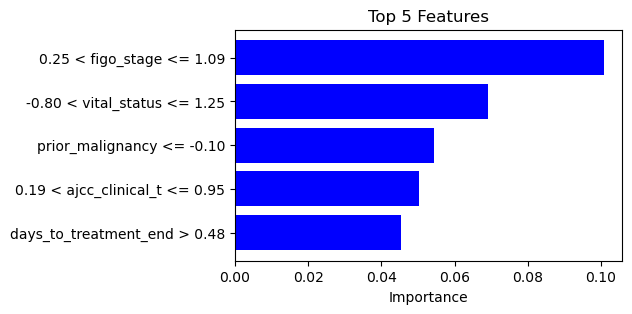

In [106]:
global_LIME('DT', C_clsDT, X_train_C_DT, X_test_C_DT, X_C_DT.columns)

**Características con mayor importancia para el modelo DT con LIME global:** figo_stage, vital_status y prior_malignancy

Respectivamente estas características aumentan la predicción del modelo en 0.1, 0.07 y 0.055 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo Random Forest

-0.80 < vital_status <= 1.25: 0.1268639867796528
0.25 < figo_stage <= 1.09: 0.09441602891476776
age_at_index <= -0.64: 0.04712660818171431
days_to_treatment_end > 0.50: 0.04340694991015434
0.19 < ajcc_clinical_t <= 0.95: 0.03172941770285974


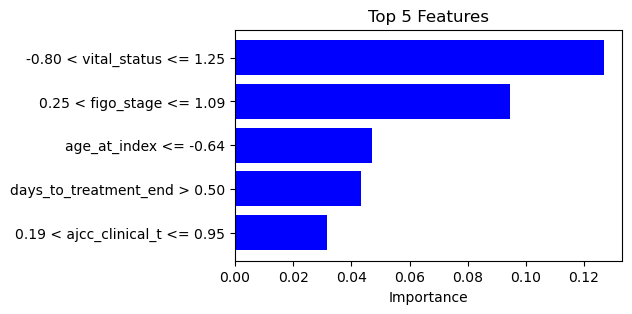

In [107]:
X_test_C_RF_array = np.array(X_test_C_RF)

X_C_RF2 = df_C2.drop('cancer',axis=1)
labels_RF = X_C_RF2.columns

global_LIME('RF', C_clsRF, X_train_C_RF, X_test_C_RF_array, labels_RF)

**Características con mayor importancia para el modelo RF con LIME global:** vital_status, figo_stage y days_to_treatment_end

Respectivamente estas características aumentan la predicción del modelo en 0.13, 0.09 y 0.047 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo SVM

0.19 < ajcc_clinical_t <= 0.95: 0.07741588223093943
0.25 < figo_stage <= 1.09: 0.058914963612026854
treatment_type <= -0.38: 0.05469874107667089
-0.80 < vital_status <= 1.25: 0.04021005289920759
days_to_treatment_end > 0.50: 0.027861609197517855


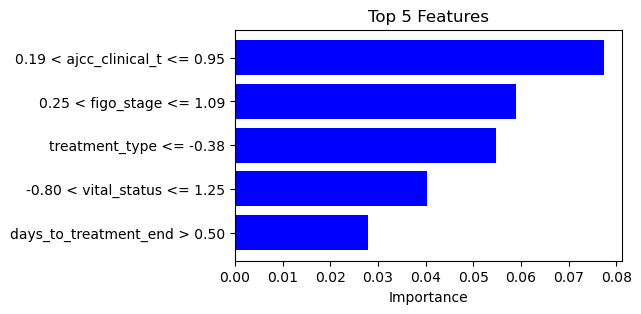

In [108]:
global_LIME('SVM', C_clsSVM, X_train_C_SVM, X_test_C_SVM, X_C_SVM.columns)

**Características con mayor importancia para el modelo SVM con LIME global:** ajcc_clinical_t, figo_stage y treatment_type

Respectivamente estas características aumentan la predicción del modelo en 0.078, 0.059 y 0.055 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo XGBoost

-0.80 < vital_status <= 1.25: 0.1471445509799614
0.25 < figo_stage <= 1.09: 0.06384134457653202
0.19 < ajcc_clinical_t <= 0.95: 0.05270679755716665
days_to_treatment_start > 0.39: 0.027777818800531807
treatment_intent_type <= -0.35: 0.024014531716028936


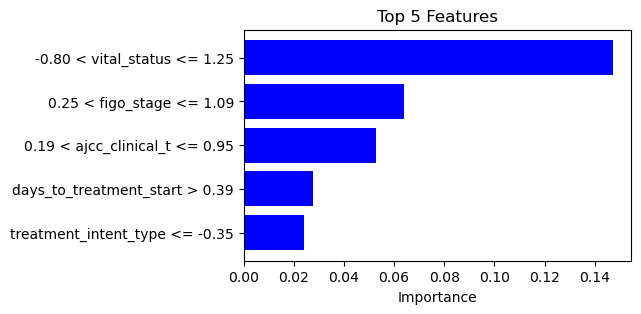

In [109]:
X_test_C_XG_array = np.array(X_test_C_XG)

X_C_XG2 = df_C2.drop('cancer',axis=1)
labels_XG = X_C_XG2.columns

global_LIME('XG', C_clsXG, X_train_C_XG, X_test_C_XG_array, labels_XG)

**Características con mayor importancia para el modelo XG con LIME global:** vital_status, figo_stage y ajcc_clinical_t

Respectivamente estas características aumentan la predicción del modelo en 0.15, 0.064 y 0.05 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

#### Explicación con LIME global del modelo MLP

pregnant_at_diagnosis <= -0.07: 0.10494745257469947
days_to_diagnosis <= -0.14: 0.09696905503940235
0.19 < ajcc_clinical_t <= 0.95: 0.06218871544399222
treatment_type <= -0.38: 0.0571045854667264
-0.80 < vital_status <= 1.25: 0.04099706073887718


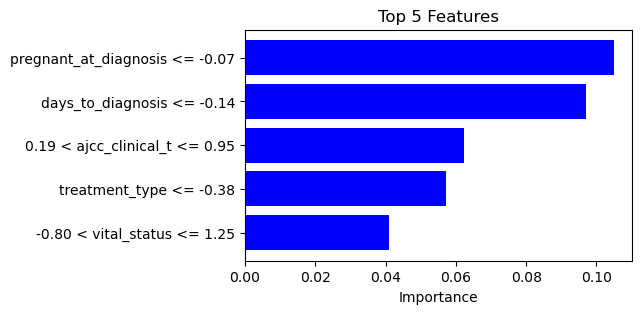

In [110]:
X_test_C_MLP_array = np.array(X_test_C_MLP)

X_C_MLP2 = df_C2.drop('cancer',axis=1)
labels_MLP = X_C_MLP2.columns

global_LIME('MLP', C_clsMLP, X_train_C_MLP, X_test_C_MLP_array, labels_MLP)

**Características con mayor importancia para el modelo MLP con LIME global:** pregnant_at_diagnosis, days_to_diagnosis y ajcc_clinical_t

Respectivamente estas características aumentan la predicción del modelo en 0.11, 0.097 y 0.062 unidades aproximadamente cuando toman los valores especificados en el anterior gráfico.

### Explicaciones locales para entender el modelo basadas en la presencia de características mediante métodos post-hoc (explicativos extrínsecos)

### LIME (local)

In [111]:
def local_LIME(i, id_model, model, data_train, data_test, labels):
    
    data_train_array = np.array(data_train)
    data_test_array = np.array(data_test)
    
    explainer_LIME = LimeTabularExplainer(data_train_array, feature_names=labels, class_names=['Cancer', 'No cancer'], 
                                          verbose=True, mode='classification', random_state=2)
    
    
    if id_model in ['DT','RF','SVM','XG','MLP']:
        explanation = explainer_LIME.explain_instance(data_test_array[i], model.predict_proba)
        
    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None

    explanation_list = explanation.as_list()
    explanation_df = pd.DataFrame(explanation_list, columns=['Feature', 'Contribution'])
    display(explanation_df)
    
    explanation.show_in_notebook(show_table=True) # EJECUTAR DE NUEVO TODAS LAS CELDAS INFERIORES PARA VER LAS TABLAS LIME

#### Explicación con LIME local del modelo de Árboles de Decisión

In [112]:
local_LIME(67, 'DT', C_clsDT, X_train_C_DT, X_test_C_DT, X_C_DT.columns)

Intercept 0.10026037035119623
Prediction_local [0.61188486]
Right: 0.0


,Feature,Contribution
0,0.25 < figo_stage <= 1.09,0.262366
1,-0.80 < vital_status <= 1.25,0.096499
2,age_at_diagnosis <= -0.63,0.084638
3,-0.69 < days_to_treatment_end <= -0.16,-0.075953
4,days_to_diagnosis <= -0.14,0.068399
5,treatment_type <= -0.38,0.054744
6,therapeutic_agents <= -0.12,0.052946
7,-0.56 < ajcc_clinical_t <= 0.19,-0.037459
8,0.28 < ajcc_pathologic_t <= 0.53,0.034575
9,year_of_birth > 0.73,-0.029132


Teniendo en cuenta lo siguiente:
* **Barras de predicción**: probabilidad de pertenencia a cada una de las posibles clases según LIME.
* **Gráfico de barras:** magnitud y dirección de la contribución de cada característica a la predicción. Las barras naranjas representan la contribución a la clase negativa (0: no cáncer), mientras que las barras azules representan la contribución a la clase positiva (1: cáncer).
* **Tabla:** características más influyentes y sus respectivas contribuciones a la predicción. 

In [126]:
y_pred_C_DT[67]

0

**Características con mayor importancia para la instancia 67 del modelo DT con LIME local:** figo_stage, vital_status y age_at_diagnosis

Respectivamente estas características contribuyen a la predicción del modelo en 1.09, 1.25 y -2.01 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo DT corresponde a la clase negativa (0: no cancer), mientras que la predicción local de LIME corresponde a la clase positiva (1: cancer).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'figo_stage', 'vital_status' y 'age_at_diagnosis' son las que más contribuyen a la clase negativa (en 0.26, 0.1 y 0.08 unidades respectivamente), mientras que las variables 'days_to_treatment_end', 'ajcc_clinical_t' y 'year_of_birth' son las que más contribuyen a la clase positiva (en -0.08, -0.04 y -0.03 unidades respectivamente).

#### Explicación con LIME local del modelo Random Forest

In [113]:
X_C_RF2 = df_C2.drop('cancer',axis=1)
labels_RF = X_C_RF2.columns

local_LIME(67, 'RF', C_clsRF, X_train_C_RF, X_test_C_RF, labels_RF)

Intercept 0.5352511893843115
Prediction_local [0.55658822]
Right: 0.9914285714285714


,Feature,Contribution
0,vital_status <= -0.80,-0.200987
1,days_to_treatment_end > 0.50,0.125863
2,age_at_index <= -0.64,0.100797
3,-1.14 < figo_stage <= 0.25,-0.091450
4,days_to_treatment_start > 0.39,0.052902
5,pregnant_at_diagnosis <= -0.07,-0.049569
6,0.19 < ajcc_clinical_t <= 0.95,0.046069
7,age_at_diagnosis <= -0.63,0.033207
8,therapeutic_agents <= -0.12,0.030657
9,treatment_frequency <= -0.02,-0.026153


In [127]:
y_pred_C_RF[67]

1

**Características con mayor importancia para la instancia del modelo RF con LIME local:** vital_status, days_to_treatment_end y  age_at_index

Respectivamente estas características contribuyen a la predicción del modelo en -0.8, 0.98 y -1.3 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo RF corresponde a la clase positiva (1: cancer), mientras que la predicción local de LIME corresponde a la clase negativa (0: no cancer).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'days_to_treatment_end', 'age_at_index' y 'days_to_treatment_start' son las que más contribuyen a la clase negativa (en 0.13, 0.1 y 0.05 unidades respectivamente), mientras que las variables 'vital_status', 'figo_stage' y 'pregnant_at_diagnosis' son las que más contribuyen a la clase positiva (en -0.2, -0.09 y -0.05 unidades respectivamente).

#### Explicación con LIME local del modelo SVM

In [114]:
local_LIME(67, 'SVM', C_clsSVM, X_train_C_SVM, X_test_C_SVM, X_C_SVM.columns)

Intercept 0.524958938656914
Prediction_local [0.6401668]
Right: 0.9682621647023053


,Feature,Contribution
0,0.19 < ajcc_clinical_t <= 0.95,0.082726
1,treatment_frequency <= -0.02,-0.073640
2,days_to_treatment_end > 0.50,0.058368
3,vital_status <= -0.80,-0.049168
4,treatment_type <= -0.38,0.047909
5,pregnant_at_diagnosis <= -0.07,0.047666
6,initial_disease_status <= -0.21,-0.044352
7,age_at_diagnosis <= -0.63,0.037921
8,age_at_index <= -0.64,0.036874
9,ajcc_pathologic_t <= 0.53,-0.029095


In [128]:
y_pred_C_SVM[67]

1

**Características con mayor importancia para la instancia 67 del modelo SVM con LIME local:** ajcc_clinical_t, treatment_frequency y days_to_treatment_end

Respectivamente estas características contribuyen a la predicción del modelo en 0.95, -0.02 y 0.98 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo SVM corresponde a la clase positiva (1: cancer), mientras que la predicción local de LIME corresponde a la clase negativa (0: no cancer).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'ajcc_clinical_t', 'days_to_treatment_end' y 'treatment_type' son las que más contribuyen a la clase negativa (en 0.08, 0.06 y 0.05 unidades respectivamente), mientras que las variables 'treatment_frequency', 'vital_status' y 'initial_disease_status' son las que más contribuyen a la clase positiva (en -0.07, -0.05 y -0.04 unidades respectivamente).

#### Explicación con LIME local del modelo XGBoost

In [115]:
X_C_XG2 = df_C2.drop('cancer',axis=1)
labels_XG = X_C_XG2.columns

local_LIME(67, 'XG', C_clsXG, X_train_C_XG, X_test_C_XG, labels_XG)

Intercept 0.40150491657013465
Prediction_local [0.25229952]
Right: 0.9993155


,Feature,Contribution
0,vital_status <= -0.80,-0.317289
1,ajcc_pathologic_t <= 0.53,-0.215797
2,-1.14 < figo_stage <= 0.25,-0.105504
3,0.19 < ajcc_clinical_t <= 0.95,0.102359
4,days_to_treatment_start > 0.39,0.101146
5,prior_malignancy <= -0.10,0.093527
6,age_at_index <= -0.64,0.065691
7,treatment_type <= -0.38,0.049112
8,treatment_frequency <= -0.02,0.040845
9,therapeutic_agents <= -0.12,0.036705


In [129]:
y_pred_C_XG[67]

1

**Características con mayor importancia para la instancia 67 del modelo XG con LIME local:** vital_status, ajcc_pathologic_t y figo_stage

Respectivamente estas características contribuyen a la predicción del modelo en -0.8, 0.53 y -0.58 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo XG corresponde a la clase positiva (1: cancer), mientras que la predicción local de LIME corresponde a la clase negativa (0: no cancer). 

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'ajcc_clinical_t', 'days_to_treatment_start' y 'prior_malignancy' son las que más contribuyen a la clase negativa (en 0.1, 0.1 y 0.09 unidades respectivamente), mientras que las variables 'vital_status', 'ajcc_pathologic_t' y 'figo_stage' son las que más contribuyen a la clase positiva (en -0.32, -0.22 y -0.11 unidades respectivamente).

#### Explicación con LIME local del modelo MLP

In [116]:
X_C_MLP2 = df_C2.drop('cancer',axis=1)
labels_MLP = X_C_MLP2.columns

local_LIME(67, 'MLP', C_clsMLP, X_train_C_MLP, X_test_C_MLP, labels_MLP)

Intercept 0.6831667684488596
Prediction_local [0.80131729]
Right: 0.9999805948646643


,Feature,Contribution
0,treatment_frequency <= -0.02,-0.400345
1,0.19 < ajcc_clinical_t <= 0.95,0.243729
2,ajcc_pathologic_t <= 0.53,-0.203564
3,vital_status <= -0.80,-0.198162
4,treatment_type <= -0.38,0.187014
5,pregnant_at_diagnosis <= -0.07,0.174975
6,age_at_index <= -0.64,0.172984
7,days_to_diagnosis <= -0.14,0.170643
8,year_of_birth > 0.73,-0.165203
9,primary_diagnosis <= 0.15,0.136080


In [130]:
y_pred_C_MLP[67]

1

**Características con mayor importancia para la instancia 67 del modelo MLP con LIME local:** treatment_frequency, ajcc_clinical_t y ajcc_pathologic_t

Respectivamente estas características contribuyen a la predicción del modelo en -0.02, 0.95 y 0.53 unidades aproximadamente, según la tabla.

Para esta instancia concreta, la predicción del modelo MLP corresponde a la clase positiva (1: cancer), mientras que la predicción local de LIME corresponde a la clase negativa (0: no cancer).

Según el modelo local de LIME, dentro de los rangos especificados, las variables 'ajcc_clinical_t', 'treatment_type' y 'pregnant_at_diagnosis' son las que más contribuyen a la clase negativa (en 0.24, 0.19 y 0.17 unidades respectivamente), mientras que las variables 'treatment_frequency', 'ajcc_pathologic_t' y 'vital_status' son las que más contribuyen a la clase positiva (en -0.4, -0.2 y -0.2 unidades respectivamente).

### GroupedCE

In [132]:
import gce
from gce import GroupedCEExplainer
import plots
from IPython.display import Image
from plots import plot_gce_explanation

In [86]:
def local_GCE(i, id_model, model, data_train, labels, instance):
    
    explainer_GCE = GroupedCEExplainer(model=model.predict, data=data_train, feature_names=labels, top_k_features=3, 
                                       max_dataset_size=100, random_seed=2)

    if id_model in ['RF','XG','MLP']:
        predicted_class = model.predict(instance[[i],:])[0]
        explanation = explainer_GCE.explain_instance(instance[[i],:])

    elif id_model in ['DT','SVM']:
        predicted_class = model.predict(instance.iloc[[i],:])[0]
        explanation = explainer_GCE.explain_instance(instance.iloc[[i],:])

    else:
        print('Only DT, RF, SVM, XG or MLP id_models are valid')
        return None
    
    print(f"{model} predicted class for instance {i}: {predicted_class}")

    fig = plot_gce_explanation(explanation, title=f'Expectativas condicionales agrupadas con {id_model}')
    instance_plot = fig.to_image(format="png", width=500, height=500)

    return Image(instance_plot)

#### Explicación con GCE del modelo de Árboles de Decisión

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['ajcc_clinical_t', 'figo_stage', 'vital_status']


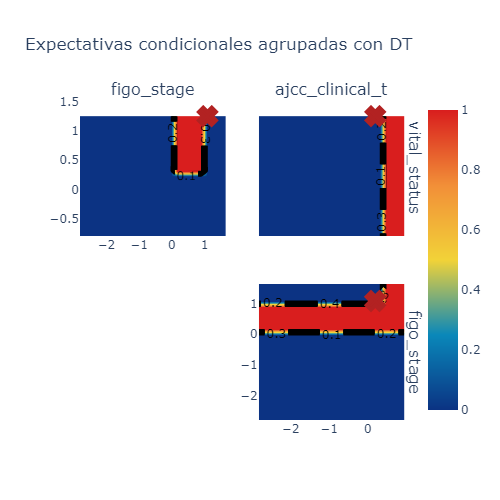

In [87]:
local_GCE(67,'DT', C_clsDT, X_train_C_DT, X_C_DT.columns, X_test_C_DT)

Teniendo en cuenta lo siguiente:
* **Ejes**: tres características identificadas por GCE como las más importantes para una instancia concreta dentro de un modelo de Machine Learning.
   - **Eje x:** valores que toma la característica especificada en la columna del gráfico. 
   - **Eje y:** valores que toma la característica especificada en la fila del gráfico.
* **Gráficas:** impacto de la interacción entre dos características importantes para una instancia concreta que determina su predicción.
* **Escala de colores:** tonalidades más cercanas al rojo indican una mayor predicción hacia la clase objetivo, mientras que tonalidades más cercanas al azul indican una menor predicción.
* **Cruz roja:** valor específico que toman las características analizadas para la instancia de estudio.

**Características con mayor importancia para la instancia 67 del modelo DT con GCE local:** ajcc_clinical_t, figo_stage y vital_status

Según el algoritmo GCE:
- La interacción entre la característica 'figo_stage' cuando toma valores en el rango [0,1] y 'vital_status' toma valores superiores a 0, indica una predicción alta hacia la clase objetivo.
- La interacción entre la característica 'ajcc_clinical_t' cuando toma valores inferiores a 0 y 'figo_stage' toma valores en el rango [0,1] o cuando ambas características toman valores superiores a 0, indica una predicción alta hacia la clase objetivo.
- La interacción entre la característica 'ajcc_clinical_t' cuando toma valores superiores a 0 y 'vital_status' en todo su rango, indica una predicción alta hacia la clase objetivo.

#### Explicación con GCE del modelo Random Forest

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['primary_diagnosis', 'figo_stage', 'vital_status']


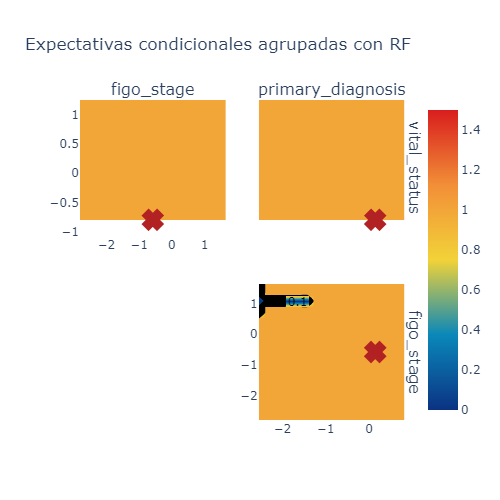

In [88]:
X_C_RF2 = df_C2.drop('cancer',axis=1)
labels_RF = X_C_RF2.columns

local_GCE(67,'RF', C_clsRF, X_train_C_RF, labels_RF, X_test_C_RF)

**Características con mayor importancia para la instancia 67 del modelo RF con GCE local:** primary_diagnosis, figo_stage y vital_status

- La interacción entre los pares de características 'figo_stage'-'vital_status' y 'primary_diagnosis'-'vital_status' indica una predicción intermedia-alta hacia la clase objetivo en todo su rango.
- La interacción entre la característica 'figo_stage' cuando toma valores superiores a 0.5 y 'primary_diagnosis' toma valores inferiores a -1, indica una predicción baja hacia la clase objetivo.

#### Explicación con GCE del modelo SVM

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['ajcc_clinical_t', 'figo_stage', 'vital_status']


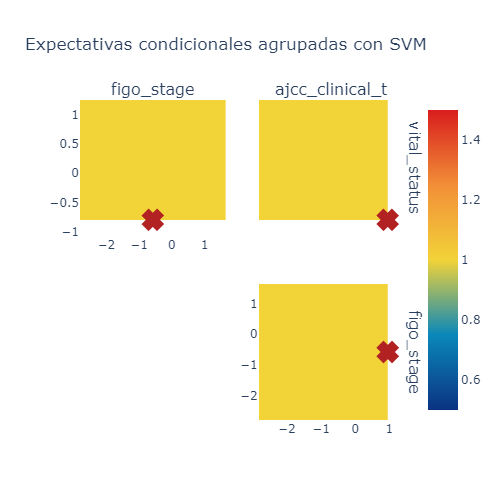

In [89]:
local_GCE(67,'SVM', C_clsSVM, X_train_C_SVM, X_C_SVM.columns, X_test_C_SVM)

**Características con mayor importancia para la instancia 67 del modelo SVM con GCE local:** ajcc_clinical_t, figo_stage y vital_status

Según el algoritmo GCE, la interacción entre todos los pares de características indica una predicción intermedia hacia la clase objetivo en todo su rango.

#### Explicación con GCE del modelo XGBoost

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['ajcc_clinical_t', 'figo_stage', 'vital_status']


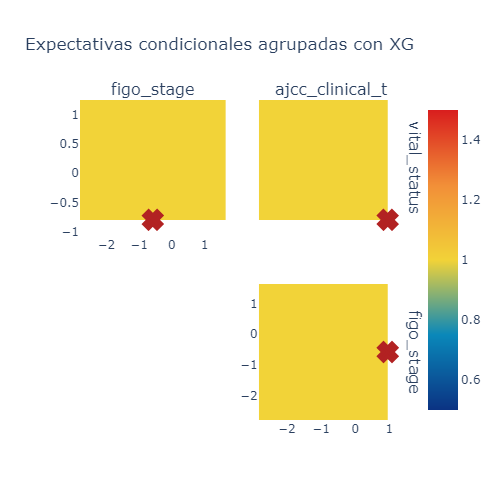

In [90]:
X_C_XG2 = df_C2.drop('cancer',axis=1)
labels_XG = X_C_XG2.columns

local_GCE(67,'XG', C_clsXG, X_train_C_XG, labels_XG, X_test_C_XG)

**Características con mayor importancia para la instancia 67 del modelo XG con GCE local:** ajcc_clinical_t, figo_stage y vital_status

Según el algoritmo GCE, la interacción entre todos los pares de características indica una predicción intermedia hacia la clase objetivo en todo su rango.

#### Explicación con GCE del modelo MLP

  0%|          | 0/100 [00:00<?, ?it/s]

Considering Top 3 features according to SHAP: ['ajcc_clinical_t', 'age_at_index', 'vital_status']


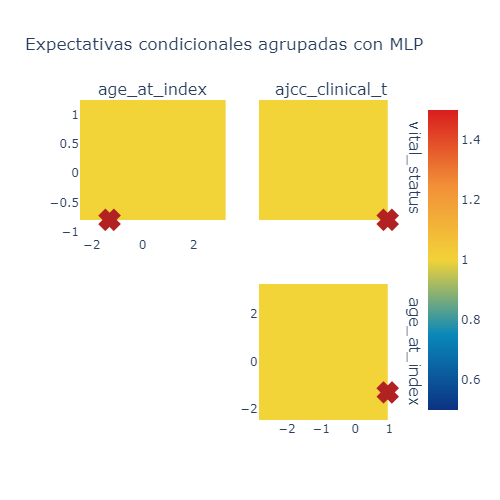

In [91]:
X_C_MLP2 = df_C2.drop('cancer',axis=1)
labels_MLP = X_C_MLP2.columns

local_GCE(67,'MLP', C_clsMLP, X_train_C_MLP, labels_MLP, X_test_C_MLP)

**Características con mayor importancia para la instancia 67 del modelo MLP con GCE local:** ajcc_clinical_t, age_at_index y vital_status

Según el algoritmo GCE, la interacción entre todos los pares de características indica una predicción intermedia hacia la clase objetivo en todo su rango.

### Explicaciones globales para entender el modelo mediante métodos intrínsecos

### GLRM

In [266]:
from aix360.algorithms.rbm import GLRMExplainer, LogisticRuleRegression, FeatureBinarizer

#### Separación de los datos en conjuntos 'train' y 'test'

In [267]:
X_C_GLRM = df_C2.drop('cancer',axis=1)
y_C_GLRM = df_C2['cancer']

X_train_C_GLRM, X_test_C_GLRM, y_train_C_GLRM, y_test_C_GLRM = train_test_split(X_C_GLRM, y_C_GLRM, test_size=0.2, random_state=1)

#### Binarización de los datos

In [268]:
FB = FeatureBinarizer(negations=True)

X_train_C_GLRM_FB = FB.fit_transform(X_train_C_GLRM)
X_test_C_GLRM_FB = FB.transform(X_test_C_GLRM)

In [269]:
print("BEFORE BINARIZER")
print(f"X_train: {X_train_C_GLRM.shape[1]} features")
print(f"X_test: {X_test_C_GLRM.shape[1]} features\n")

print("AFTER BINARIZER")
print(f"X_train: {X_train_C_GLRM_FB.shape[1]} features")
print(f"X_test: {X_test_C_GLRM_FB.shape[1]} features")

BEFORE BINARIZER
X_train: 34 features
X_test: 34 features

AFTER BINARIZER
X_train: 280 features
X_test: 280 features


### LOGISTIC MODEL

#### Creación del modelo logistic y entrenamiento con el conjunto  'train'

In [270]:
logistic_model = LogisticRuleRegression()
explainer_GLRM_LO = GLRMExplainer(logistic_model)
explainer_GLRM_LO.fit(X_train_C_GLRM_FB, y_train_C_GLRM)

#### Predicción con el conjunto 'test'

In [271]:
y_pred_C_GLRM_LO = explainer_GLRM_LO.predict(X_test_C_GLRM_FB)

#### Métricas del modelo y matriz de confusión

In [272]:
accuracy_C_GLRM_LO, precision_C_GLRM_LO, recall_C_GLRM_LO, f1_C_GLRM_LO, conf_matrix_C_GLRM_LO, specificity_C_GLRM_LO = XAI_calculate_metrics(y_test_C_GLRM, y_pred_C_GLRM_LO, explainer_GLRM_LO)

print(f'Accuracy: {accuracy_C_GLRM_LO}')
print(f'Precision: {precision_C_GLRM_LO}')
print(f'Recall: {recall_C_GLRM_LO}')
print(f'F1-Score: {f1_C_GLRM_LO}')
print(f'Specificity: {specificity_C_GLRM_LO}')

Accuracy: 0.7364341085271318
Precision: 0.7102272727272727
Recall: 0.7102272727272727
F1-Score: 0.7102272727272727
Specificity: 0.7582938388625592


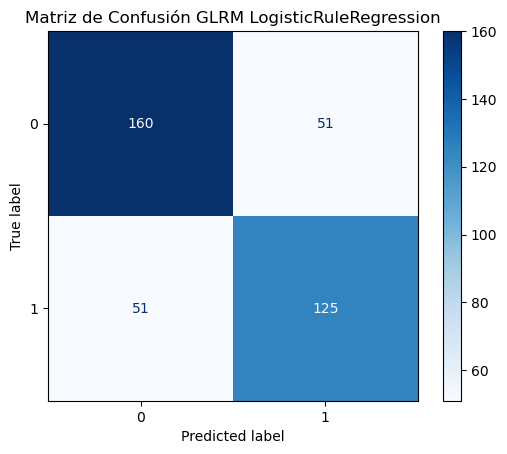

In [273]:
explainer_GLRM_LO_display = ConfusionMatrixDisplay(conf_matrix_C_GLRM_LO)
explainer_GLRM_LO_display.plot(values_format='d', cmap='Blues')
explainer_GLRM_LO_display.ax_.set(title='Matriz de Confusión GLRM LogisticRuleRegression');

De las 387 instancias del conjunto de test, el modelo GLRM con LogisticRuleRegression ha clasificado 160 como verdaderos negativos (TN), 51 como falsos negativos (FN), 51 como falsos positivos (FP) y 125 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 285 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 73,64% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 71,02% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 71,02% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 71,02%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 75,83% de las instancias negativas reales.

#### Explicaciones del modelo

In [274]:
importances_GLRM_LO = explainer_GLRM_LO.explain()
importances_GLRM_LO.sort_values('coefficient', ascending=False)

,rule,coefficient
0,(intercept),1.148303
3,age_at_index > -0.55 AND figo_stage <= 0.81,-1.119295
2,figo_stage <= 0.81 AND days_to_treatment_end <...,-1.383274
1,vital_status == -0.7976276160432189 AND figo_s...,-1.456392


GLRM se trata de un modelo basado en reglas, las cuales se caracterizan por tener una o múltiples condiciones sobre los valores de las características. Estas condiciones se combinan para formar reglas complejas que el modelo utiliza para hacer predicciones.

Concretamente, todas las reglas del modelo GLRM con LogisticRuleRegression son de orden superior, es decir, combinaciones de múltiples características, lo que significa que el modelo es capaz de capturar interacciones entre dichas características.

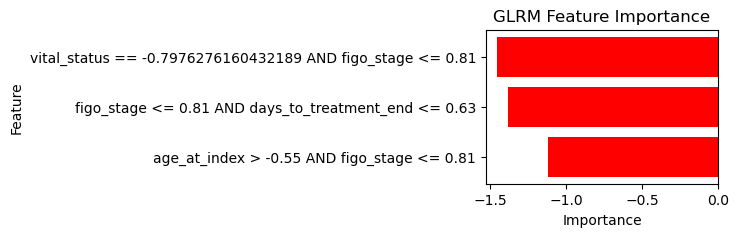

In [275]:
df_GLRM_LO = importances_GLRM_LO.iloc[1:]

plt.figure(figsize=(3,2))
plt.barh(df_GLRM_LO['rule'], df_GLRM_LO['coefficient'], color='red')

#plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('GLRM Feature Importance')
plt.show()

En el gráfico anterior se muestran las reglas aprendidas por el modelo GLRM con LogisticRuleRegression, con sus correspondientes coeficientes, los cuales representan el impacto que tiene cada regla sobre el modelo.

Según este modelo, los pares de características 'vital_status'-'figo_stage', 'figo_stage'-'days_to_treatment_end' y 'age_at_index'-'figo_stage' en los rangos especificados, afectan al modelo disminuyendo la probabilidad de pertenencia a la clase objetivo en -1.12, -1.38 y -1.46 unidades respectivamente.

### BRCG

In [283]:
from aix360.algorithms.rbm import BRCGExplainer, BooleanRuleCG

#### Separación de los datos en conjuntos 'train' y 'test'

In [284]:
X_C_BRCG = df_C2.drop('cancer',axis=1)
y_C_BRCG = df_C2['cancer']

X_train_C_BRCG, X_test_C_BRCG, y_train_C_BRCG, y_test_C_BRCG = train_test_split(X_C_BRCG, y_C_BRCG, test_size=0.2, random_state=1)

#### Binarización de los datos

In [285]:
FB = FeatureBinarizer(negations=True)

X_train_C_BRCG_FB = FB.fit_transform(X_train_C_BRCG)
X_test_C_BRCG_FB = FB.transform(X_test_C_BRCG)

In [286]:
print("BEFORE BINARIZER")
print(f"X_train: {X_train_C_BRCG.shape[1]} features")
print(f"X_test: {X_test_C_BRCG.shape[1]} features\n")

print("AFTER BINARIZER")
print(f"X_train: {X_train_C_BRCG_FB.shape[1]} features")
print(f"X_test: {X_test_C_BRCG_FB.shape[1]} features")

BEFORE BINARIZER
X_train: 34 features
X_test: 34 features

AFTER BINARIZER
X_train: 280 features
X_test: 280 features


#### Creación del modelo boolean y entrenamiento con el conjunto  'train'

In [287]:
boolean_model = BooleanRuleCG(silent=True)
explainer_BRCG = BRCGExplainer(boolean_model)
explainer_BRCG.fit(X_train_C_BRCG_FB, y_train_C_BRCG)

#### Predicción con el conjunto 'test'

In [288]:
y_pred_C_BRCG = explainer_BRCG.predict(X_test_C_BRCG_FB)

#### Métricas del modelo y matriz de confusión

In [289]:
accuracy_C_BRCG, precision_C_BRCG, recall_C_BRCG, f1_C_BRCG, conf_matrix_C_BRCG, specificity_C_BRCG = XAI_calculate_metrics(y_test_C_BRCG, y_pred_C_BRCG, explainer_BRCG)

print(f'Accuracy: {accuracy_C_BRCG}')
print(f'Precision: {precision_C_BRCG}')
print(f'Recall: {recall_C_BRCG}')
print(f'F1-Score: {f1_C_BRCG}')
print(f'Specificity: {specificity_C_BRCG}')

Accuracy: 0.7622739018087855
Precision: 0.8134328358208955
Recall: 0.6193181818181818
F1-Score: 0.7032258064516128
Specificity: 0.8815165876777251


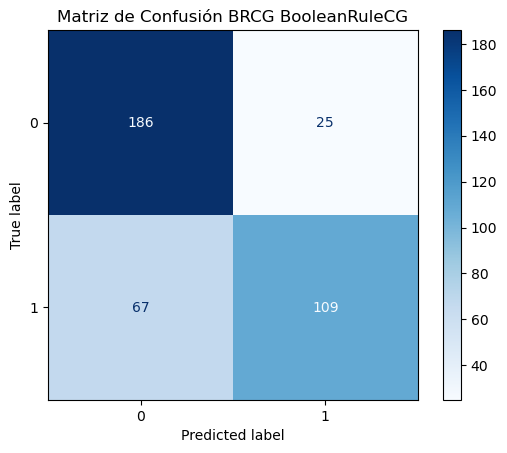

In [290]:
explainer_BRCG_display = ConfusionMatrixDisplay(conf_matrix_C_BRCG)
explainer_BRCG_display.plot(values_format='d', cmap='Blues')
explainer_BRCG_display.ax_.set(title='Matriz de Confusión BRCG BooleanRuleCG');

De las 387 instancias del conjunto de test, el modelo BRCG con BooleanRuleCG ha clasificado 186 como verdaderos negativos (TN), 67 como falsos negativos (FN), 25 como falsos positivos (FP) y 109 como verdaderos positivos (TP). De este modo, se han clasificado correctamente 295 instancias (TN+TP).

Según la métrica 'accuracy', el modelo clasifica correctamente el 76,23% de las instancias totales.

Según la métrica 'precision', de todas las instancias predichas como positivas, el 81,34% son verdaderamente positivas.

Según la métrica 'recall', se identifican correctamente el 61,93% de las instancias positivas reales.

Según la métrica 'f1-score', el modelo presenta un rendimiento alto, concretamente del 70,32%, lo que significa que tiene un buen equilibrio entre las métricas 'precision' y 'recall'.

Según la métrica 'specificity', se identifican correctamente el 88,15% de las instancias negativas reales.

#### Explicaciones del modelo

In [302]:
importances_BRCG = explainer_BRCG.explain()

isCNF = 'Si se cumple alguna de las siguientes reglas, el modelo predice la clase negativa (0: no cancer)'
notCNF = 'Si se cumple alguna de las siguientes reglas, el modelo predice la clase positiva (1: cancer)'

print(isCNF if importances_BRCG['isCNF'] else notCNF)
print()

for rule in importances_BRCG['rules']:
    print(f'  * {rule}')

Si se cumple alguna de las siguientes reglas, el modelo predice la clase positiva (1: cancer)

  * vital_status == 1.2537178752168678 AND days_to_treatment_start > 0.59
  * days_to_last_follow_up > 0.87 AND days_to_treatment_end > 0.63
  * morphology > 1.40 AND treatment_dose <= 0.44
  * vital_status == 1.2537178752168678 AND ajcc_clinical_t > -0.18 AND ajcc_pathologic_n > -0.93 AND primary_diagnosis > -2.32 AND tumor_grade > -2.03
  * ajcc_clinical_m > -2.29 AND figo_stage > 0.25 AND icd_10_code > -3.69 AND morphology <= 0.01 AND treatment_intent_type == -0.3527302151094555 AND treatment_type <= 0.66


BRCG se trata de un modelo basado en reglas, las cuales se caracterizan por tener múltiples condiciones sobre los valores de las características. Estas condiciones se combinan para formar reglas complejas que el modelo utiliza para hacer predicciones.

Concretamente, todas las reglas del modelo BRCG con BooleanRuleCG son de orden superior, es decir, combinaciones de múltiples características, lo que significa que el modelo es capaz de capturar interacciones entre dichas características.